In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from pathlib import Path
from copy import deepcopy
import plotly.graph_objects as go
from statsmodels.stats.multitest import multipletests
from scipy.stats import fisher_exact
import seaborn as sns

In [2]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT = Path('../..')

# Input paths
TCELL_ANN_CONCAT_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_Migration.h5ad'
TCELL_ANN_CONCAT_DR_PATH              = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_con_muxlet.h5ad'

GENE_SIG_PATH = PROJECT_ROOT / 'GVHD_Reproducibility-main' / 'GVHD_spatial_signature_v8_major_curated_unique_epi_tcells_subset_Transition_EPI_REFINE.csv'

# Output paths
FIGURES_SC_DIR   = PROJECT_ROOT / 'Figures' / 'single_cell_figures'
FIGURES_TRAJ_DIR = PROJECT_ROOT / 'Figures' / 'Trajectory_figures'
DEDF_SC_TCONVS_OUTPUT_PATH = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_sc_tonvs.csv'
DEDF_SC_TCONVS_REFINED_OUTPUT_PATH = PROJECT_ROOT / 'adata_file' / 'dedf_T_cells_subsets_sc_tonvs_refined.csv'
RESI_PATH        = PROJECT_ROOT / 'adata_file' / 'Resi.h5ad'

TCELL_ANN_CONCAT_REFINED_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_Migration_refined.h5ad'

In [3]:
tcell_ann_concat = anndata.read_h5ad(TCELL_ANN_CONCAT_PATH)

[<Axes: title={'center': 'ITGAE'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GZMA'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GZMB'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'CTLA4'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'PDCD1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'IL7R'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'ZNF683'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GVHD_Grade_1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'TOX'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'HAVCR2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'LAG3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'T_cell_subsets'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'LPorIE'}, xlabel='UMAP1', ylabel='UMAP2'>]

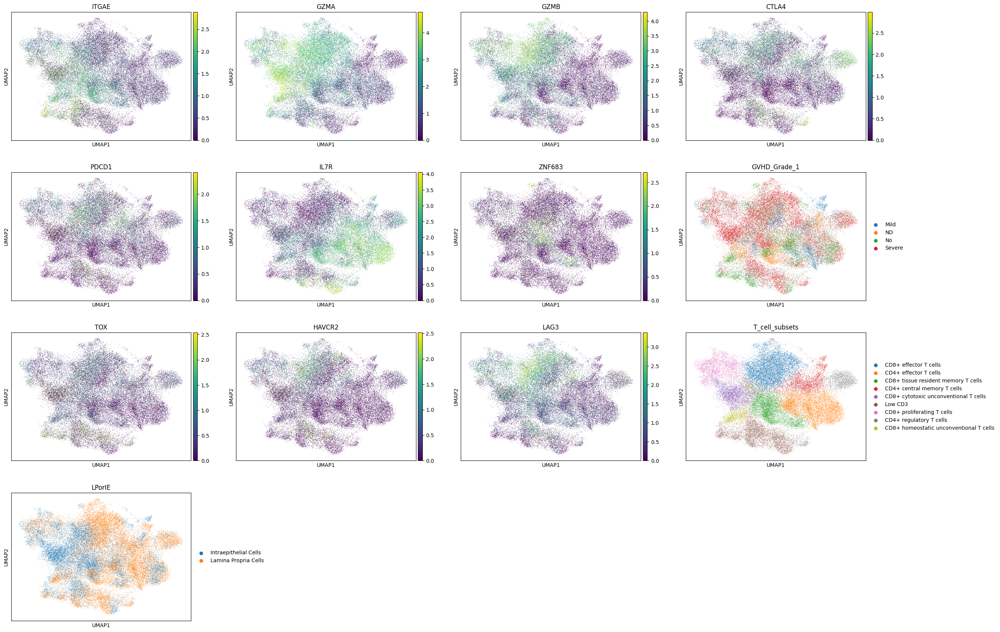

In [4]:
sc.pl.umap(tcell_ann_concat, color=['ITGAE','GZMA','GZMB','CTLA4','PDCD1','IL7R','ZNF683',"GVHD_Grade_1","TOX", "HAVCR2", "LAG3",'T_cell_subsets', 'LPorIE'], vmin=0, vmax = lambda x: np.quantile(x, 0.99), s = 2, show=False)   



In [5]:
Tconvs  = tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets'].isin(['CD8+ effector T cells','CD8+ tissue resident memory T cells',"CD8+ proliferating T cells"])]

In [6]:
sc.tl.rank_genes_groups(Tconvs, groupby="T_cell_subsets",use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(Tconvs, group=None)
dedf.to_csv(DEDF_SC_TCONVS_OUTPUT_PATH)

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/scanpy/tools/_rank_genes_groups.py:639: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [7]:
Mobile = tcell_ann_concat[tcell_ann_concat.obs['Migration_all'].isin(['IE_Stationary', 'LP_Stationary', 'Mobile'])]

In [8]:
Mobile = Mobile[Mobile.obs['T_cell_subsets'].isin(['CD8+ effector T cells','CD8+ tissue resident memory T cells',"CD8+ proliferating T cells"])]

In [9]:
Mobile.obs['SampleID_T_cell_subsets'] = Mobile.obs['T_cell_subsets'].astype(str)+'_'+Mobile.obs['SampleID'].astype(str)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/3690059142.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  Mobile.obs['SampleID_T_cell_subsets'] = Mobile.obs['T_cell_subsets'].astype(str)+'_'+Mobile.obs['SampleID'].astype(str)


In [10]:
Mobile.uns['Migration_all_colors'] = ['#1f77b4','#ff7f0e','#9467bd']

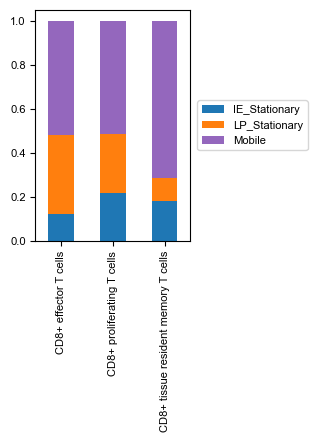

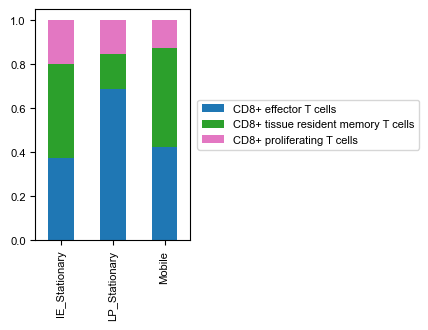

In [11]:
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (2,3),  # Set default figure size to 3×3 inches
    'lines.linewidth': 1  # Set default line width to 1
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size

obs_1 = 'T_cell_subsets'
obs_2 = 'Migration_all'

for adata in [Mobile]:
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i")
                    for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i")
                    for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1
    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for i, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[i, :] = deepcopy(obs2_to_obs1[k])
    for i, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[i, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Sort columns if necessary
    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    df_obs2.T.plot(kind="bar", stacked=True, color=adata.uns[obs_2 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.savefig(FIGURES_SC_DIR / 'conventional_mobile_bar_plot.png', dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(FIGURES_SC_DIR / 'conventional_mobile_bar_plot.pdf', dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(FIGURES_SC_DIR / 'conventional_mobile_bar_plot.svg', dpi=300, bbox_inches='tight', transparent=True)
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=adata.uns[obs_1 + '_colors'])
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/2567504917.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_proportions = analysis_df.groupby('cluster')['migration_status'].apply(lambda x: 'Mobile' in x.name).reset_index(name='has_mobile')
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/2567504917.py:17: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportions = analysis_df.groupby(['cluster', 'migration_status']).size().unstack(fill_value=0)


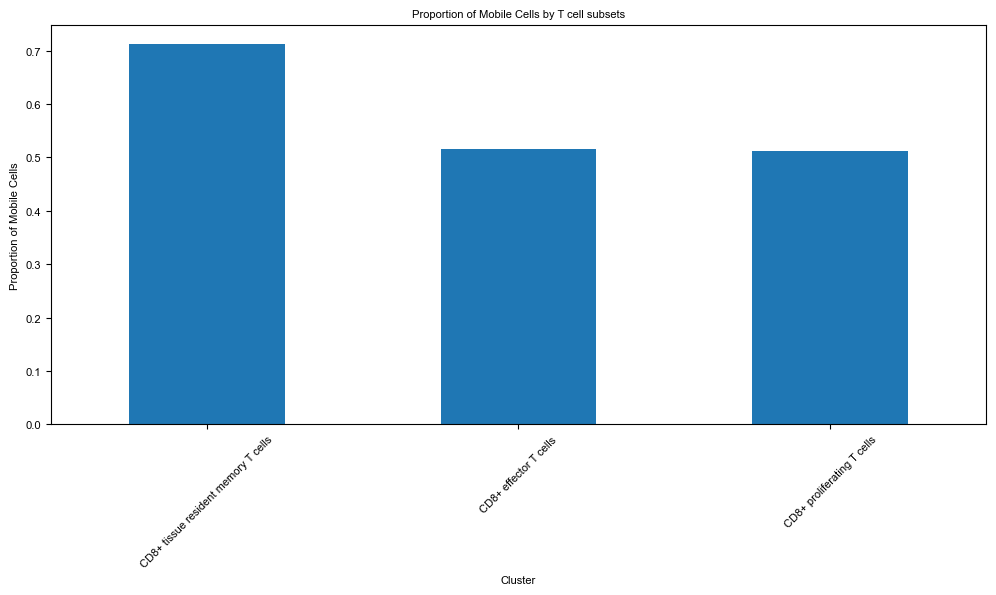

Proportion of Mobile cells by cluster:
cluster
CD8+ tissue resident memory T cells    0.711857
CD8+ effector T cells                  0.516601
CD8+ proliferating T cells             0.512821
Name: Mobile, dtype: float64

Top 5 clusters with highest Mobile proportion:
cluster
CD8+ tissue resident memory T cells    0.711857
CD8+ effector T cells                  0.516601
CD8+ proliferating T cells             0.512821
Name: Mobile, dtype: float64

Chi-square test results:
Chi-square statistic: 904.21
P-value: 2.04e-194


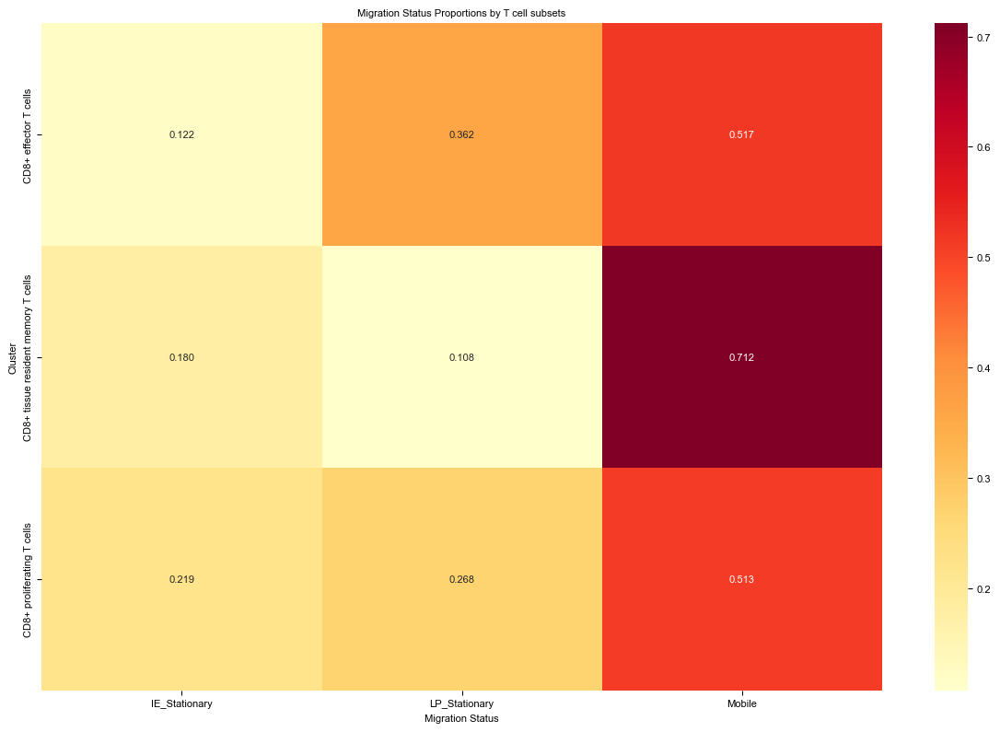

In [12]:
# Get the migration annotations
migration_data = Mobile.obs['Migration_all']

# Get the leiden clustering information
leiden_clusters = Mobile.obs['T_cell_subsets']

# Create a DataFrame to combine the information
analysis_df = pd.DataFrame({
    'cluster': leiden_clusters,
    'migration_status': migration_data
})

# Calculate the proportion of Mobile cells in each cluster
cluster_proportions = analysis_df.groupby('cluster')['migration_status'].apply(lambda x: 'Mobile' in x.name).reset_index(name='has_mobile')

# Calculate the actual proportions
proportions = analysis_df.groupby(['cluster', 'migration_status']).size().unstack(fill_value=0)
proportions = proportions.div(proportions.sum(axis=1), axis=0)

# Extract Mobile proportions
if 'Mobile' in proportions.columns:
    mobile_proportions = proportions['Mobile']
else:
    mobile_proportions = pd.Series(0, index=proportions.index)

# Sort clusters by Mobile proportion
sorted_proportions = mobile_proportions.sort_values(ascending=False)

# Create a bar plot
plt.figure(figsize=(10, 6))
sorted_proportions.plot(kind='bar')
plt.title('Proportion of Mobile Cells by T cell subsets')
plt.xlabel('Cluster')
plt.ylabel('Proportion of Mobile Cells')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print the results
print("Proportion of Mobile cells by cluster:")
print(sorted_proportions)

# Find clusters with highest Mobile proportion
top_mobile_clusters = sorted_proportions[sorted_proportions > 0].head(5)
print("\nTop 5 clusters with highest Mobile proportion:")
print(top_mobile_clusters)

# Statistical test to see if proportions are significantly different
from scipy.stats import chi2_contingency

# Create contingency table
contingency_table = pd.crosstab(analysis_df['cluster'], analysis_df['migration_status'])

# Perform chi-square test
chi2, p_value, dof, expected = chi2_contingency(contingency_table)
contingency_table
print(f"\nChi-square test results:")
print(f"Chi-square statistic: {chi2:.2f}")
print(f"P-value: {p_value:.2e}")

# Visualize with heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(proportions, annot=True, fmt='.3f', cmap='YlOrRd')
plt.title('Migration Status Proportions by T cell subsets')
plt.xlabel('Migration Status')
plt.ylabel('Cluster')
plt.tight_layout()
plt.show()

In [13]:
tcell_ann_concat_Mobile = tcell_ann_concat[tcell_ann_concat.obs['Migration_all'] =="Mobile"]

In [14]:
tcell_ann_concat_Mobile_conv = tcell_ann_concat_Mobile[tcell_ann_concat_Mobile.obs['T_cell_subsets'].isin(['CD8+ tissue resident memory T cells','CD8+ effector T cells','CD8+ proliferating T cells'] )]

In [15]:
tcell_ann_concat_Mobile_conv.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile_conv.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Dates_from_Transplantation'].astype(str)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/2113482744.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_Mobile_conv.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile_conv.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Dates_from_Transplantation'].astype(str)


/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


<Figure size 1500x600 with 0 Axes>

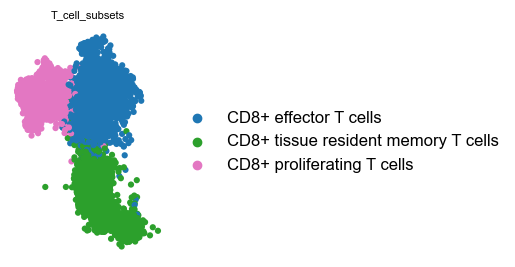

In [16]:
plt.rcParams.update({'font.size': 16}) 
plt.figure(figsize=(15, 6))
# Now the plot will be saved in the specified directory
sc.pl.umap(tcell_ann_concat_Mobile_conv[np.random.permutation(len(tcell_ann_concat_Mobile_conv))],
    color=['T_cell_subsets'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=80,
    legend_loc= 'right margin',
    legend_fontsize = 12)

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Mobile_conv_umap.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Mobile_conv_umap.pdf', dpi=300, bbox_inches='tight')

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/2018424882.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_Mobile.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['Dates_from_Transplantation'].astype(str)


['CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells', 'CD8+ effector T cells']
0
15297.0_Severe_C66_Upper GI_0.0


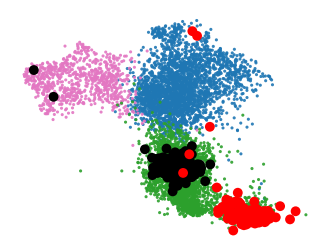

['CD8+ tissue resident memory T cells']
1
7877.0_ND_ND001_Upper GI_nan


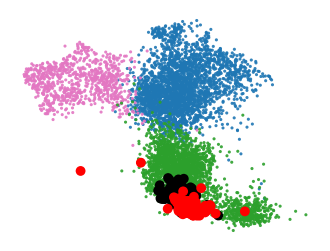

['CD8+ tissue resident memory T cells']
2
12426.0_No_R085_Upper GI_-88.0


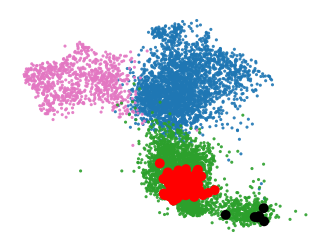

['CD8+ effector T cells', 'CD8+ proliferating T cells']
3
10854.0_Severe_C98_Upper GI_84.0


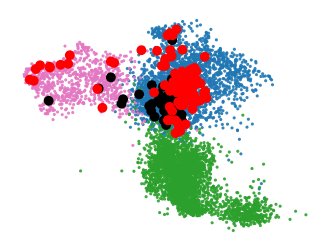

['CD8+ effector T cells', 'CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells']
4
10851.0_Severe_C98_Upper GI_84.0


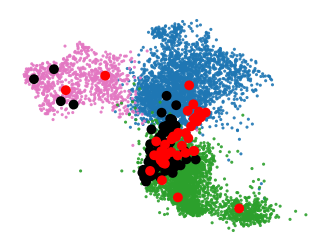

['CD8+ tissue resident memory T cells', 'CD8+ effector T cells', 'CD8+ proliferating T cells']
5
10848.0_Severe_C98_Upper GI_84.0


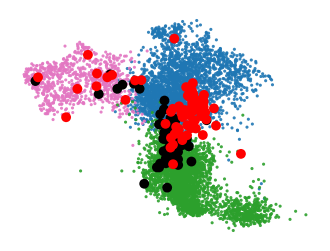

['CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells']
6
7494.0_Mild_C157_Upper GI_0.0


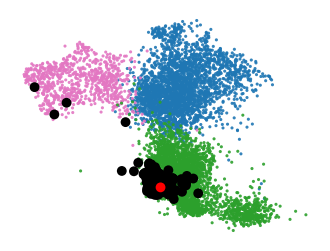

['CD8+ effector T cells', 'CD8+ proliferating T cells']
7
10850.0_Severe_C98_Upper GI_84.0


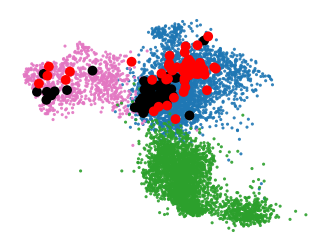

['CD8+ effector T cells', 'CD8+ proliferating T cells']
8
15330.0_Severe_C66_Upper GI_0.0


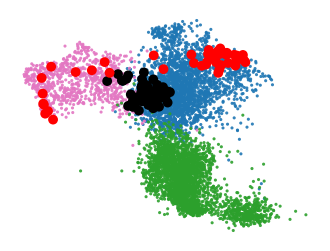

['CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells', 'CD8+ effector T cells']
9
15300.0_Severe_C66_Upper GI_0.0


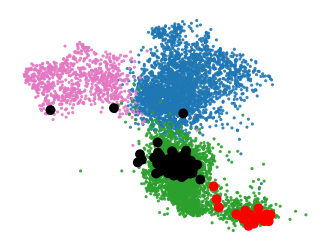

['CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells']
10
12422.0_No_R085_Upper GI_-88.0


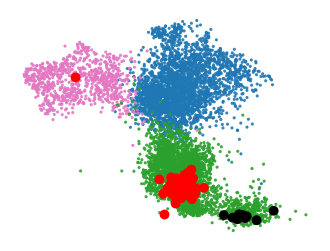

['CD8+ proliferating T cells', 'CD8+ tissue resident memory T cells']
11
7527.0_Mild_C157_Upper GI_0.0


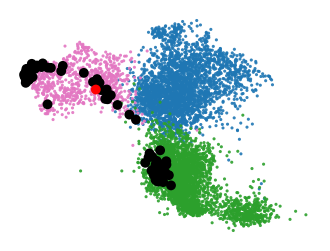

['CD8+ tissue resident memory T cells', 'CD8+ proliferating T cells', 'CD8+ effector T cells']
12
10869.0_Severe_C98_Upper GI_84.0


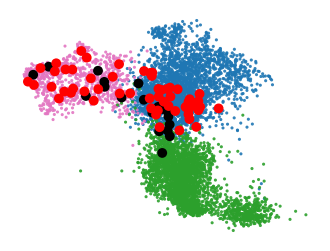

['CD8+ effector T cells', 'CD8+ proliferating T cells']
13
10905.0_Severe_C98_Upper GI_84.0


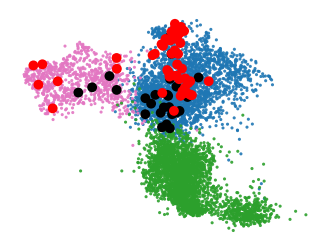

['CD8+ effector T cells', 'CD8+ proliferating T cells']
14
15305.0_Severe_C66_Upper GI_0.0


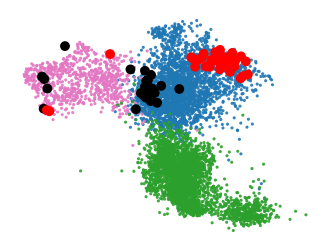

In [17]:
cd8_colors = {
    'CD8+ effector T cells': '#1f77b4',
    'CD8+ proliferating T cells': '#e377c2',
    'CD8+ tissue resident memory T cells': '#2ca02c',
    'Intraepithelial Cells': 'black',  # Custom color for IE
    'Lamina Propria Cells': 'red'    # Custom color for LP
}

tcell_ann_concat_Mobile.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile.obs['Dates_from_Transplantation'].astype(str)

clone_counts = tcell_ann_concat_Mobile_conv.obs.groupby('cc_aa_identity_Grade').size()
top_10_clones = clone_counts.nlargest(15).index

for i, value in enumerate(top_10_clones):
    plt.figure(figsize=(4, 3))

    for cell_type, color in cd8_colors.items():
        cell_data = tcell_ann_concat_Mobile_conv[tcell_ann_concat_Mobile_conv.obs['T_cell_subsets'] == cell_type]
        plt.scatter(cell_data.obsm['X_umap'][:, 0], cell_data.obsm['X_umap'][:, 1],
                    c=color, s=5, alpha=0.9, label=cell_type, edgecolor = "none", marker='o')

    clone_data = tcell_ann_concat_Mobile_conv[tcell_ann_concat_Mobile_conv.obs['cc_aa_identity_Grade'] == value]
    print(list(clone_data.obs['T_cell_subsets'].unique()))

    clone_colors = clone_data.obs['LPorIE'].map(cd8_colors)

    plt.scatter(clone_data.obsm['X_umap'][:, 0], clone_data.obsm['X_umap'][:, 1],
                c=clone_colors, s=50, alpha=1, label=f'Clone {value}', edgecolor = "none", marker='o')

    plt.gca().set_axis_off()

    print(i)
    print(value)

    plt.savefig(FIGURES_TRAJ_DIR / f'fig_{value}_umap_300dpi.png', dpi=300, bbox_inches='tight')
    plt.savefig(FIGURES_TRAJ_DIR / f'fig_{value}_umap_300dpi.pdf', dpi=300, bbox_inches='tight')
    plt.savefig(FIGURES_TRAJ_DIR / f'fig_{value}_umap_300dpi.svg', dpi=300, bbox_inches='tight')
    plt.show()

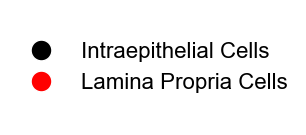

In [18]:
# Create a new figure just for the legend
plt.figure(figsize=(3, 1.5))

# Create legend handles with circular markers
ie_marker = Line2D([0], [0], marker='o', color='w', markerfacecolor='black', 
                  markersize=15, label='Intraepithelial Cells')
lp_marker = Line2D([0], [0], marker='o', color='w', markerfacecolor='red', 
                  markersize=15, label='Lamina Propria Cells')

# Add the legend
plt.legend(handles=[ie_marker, lp_marker], loc='center', frameon=False)

# Remove the axes
plt.gca().set_axis_off()

# Save the legend as a separate file
plt.savefig(FIGURES_TRAJ_DIR / 'legend_IE_LP.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'legend_IE_LP.pdf', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'legend_IE_LP.svg', dpi=300, bbox_inches='tight')

plt.show()

In [19]:
Resi = tcell_ann_concat_Mobile_conv[tcell_ann_concat_Mobile_conv.obs['T_cell_subsets'] == 'CD8+ tissue resident memory T cells']

In [20]:
# Compute the nearest neighbors
sc.pp.neighbors(Resi,use_rep="X_scVI", n_neighbors=5, random_state=0)  # You can adjust n_neighbors based on your dataset

# Run Leiden clustering
sc.tl.leiden(Resi, resolution=0.4, random_state=0)

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/624015279.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(Resi, resolution=0.4, random_state=0)


<Axes: title={'center': 'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>

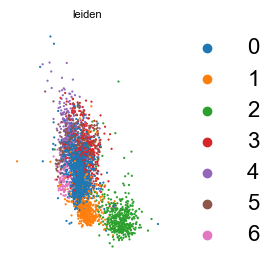

In [21]:
sc.pl.umap(Resi, color=['leiden'], show=False, frameon=False, title=None, s=10)

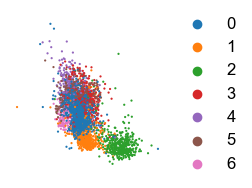

In [22]:

mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

#sc.settings.figdir = '/burg/iicd
mpl.rcParams['figure.figsize'] = (2, 2)
# Now the plot will be saved in the specified directory
sc.pl.umap(Resi, color=['leiden'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=10,
    legend_loc= 'right margin',
    legend_fontsize = 12
)

plt.gca().set_title('')

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_umap.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_umap.svg', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_umap.pdf', dpi=300, bbox_inches='tight')

# Annotating Tissue resident population

In [23]:
# Read in gene signature
gene_sig_df = pd.read_csv(GENE_SIG_PATH)

In [24]:
gene_sig_df.columns

Index(['Plasma cells', 'Myeloid', 'Fibroblast', 'B cells', 'NK cells',
       'Instestinal Epithelial cells', 'Enterocyte',
       'Stomach Epithelial cells', 'Stomach Stem cells', 'Endothelial cells',
       'Mast cells', 'CD8+ Effector T cells', 'CD4+ Effector T cells',
       'CD4+ Central Memory T cells', 'CD8+ Cytotoxic Unconventional T cells',
       'CD8+ Proliferating T cells', 'CD4+ Regulatory T cells',
       'CD8+ Homeostatic Unconventional T cells',
       'CD8+ Tissue Resident Memory T cells',
       'CD8+ Transitioning  Resident T cells',
       'Intestine Epithelial Stem cells', 'Stomach Body Epithelial cells'],
      dtype='object')

In [25]:


# clean up by removing NaN
genes = gene_sig_df['CD8+ Transitioning  Resident T cells'].dropna().tolist()
genes

['CD3E',
 'CD3G',
 'CD3D',
 'CD8A',
 'CD8B',
 'TMIGD2',
 'CD248',
 'ITGA1',
 'ITGAE',
 'CD101',
 'CTLA4',
 'PDCD1',
 'GZMA',
 'GZMB',
 'TOX2',
 'HAVCR2',
 'VCAM1',
 'ZNF683']

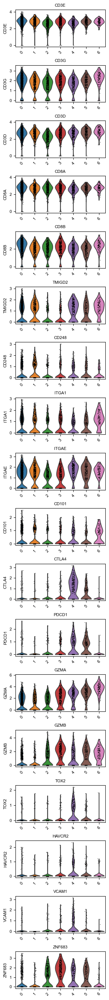

In [26]:
import matplotlib.pyplot as plt

# ── 1. Violin by leiden (per-gene subplots) ──────────────────────────────────
fig, axes = plt.subplots(len(genes), 1, figsize=(3, 1.5 * len(genes)))
for ax, gene in zip(axes, genes):
    sc.pl.violin(
        Resi,
        keys=gene,
        groupby='leiden',
        rotation=45,
        ax=ax,
        show=False
    )
    ax.set_title(gene)
plt.tight_layout()
plt.show()

In [27]:
# Plot median expression of each gene across leiden clusters

In [28]:
# clean up by removing NaN
genes = gene_sig_df['CD8+ Tissue Resident Memory T cells'].dropna().tolist()
genes

['CD3E',
 'CD3G',
 'CD3D',
 'CD8A',
 'CD8B',
 'TMIGD2',
 'CD248',
 'ITGA1',
 'ITGAE',
 'CD101',
 'XCL1',
 'CD160',
 'XCL2',
 'IL7R',
 'MYBL1']

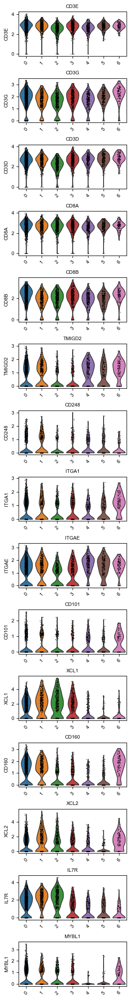

In [29]:
import matplotlib.pyplot as plt

# ── 1. Violin by leiden (per-gene subplots) ──────────────────────────────────
fig, axes = plt.subplots(len(genes), 1, figsize=(3, 1.5 * len(genes)))
for ax, gene in zip(axes, genes):
    sc.pl.violin(
        Resi,
        keys=gene,
        groupby='leiden',
        rotation=45,
        ax=ax,
        show=False
    )
    ax.set_title(gene)
plt.tight_layout()
plt.show()

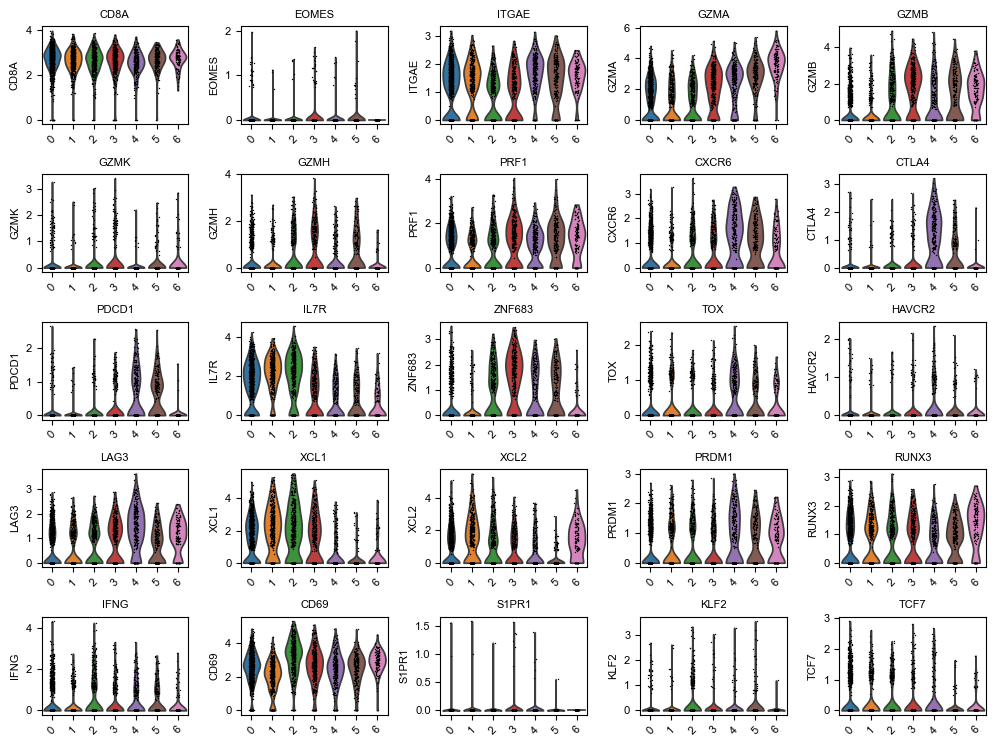

In [30]:
# Define genes and categorical variables to plot
genes = [
    'CD8A', 'EOMES', 'ITGAE', 'GZMA', 'GZMB', 'GZMK', 'GZMH', 'PRF1',
    'CXCR6', 'CTLA4', 'PDCD1', 'IL7R', 'ZNF683', 'TOX', 'HAVCR2',
    'LAG3', 'XCL1', 'XCL2', 'PRDM1', 'RUNX3', 'IFNG', 'CD69',
    'S1PR1', 'KLF2', 'TCF7'
]

# Number of subplot columns and rows
n_cols = 5
n_rows = int(np.ceil(len(genes) / n_cols))

# Create subplot grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(2 * n_cols, 1.5 * n_rows))
axes = np.array(axes).reshape(-1)  # flatten in case of multiple rows

# Plot one violin plot per gene
for ax, gene in zip(axes, genes):
    sc.pl.violin(
        Resi,
        keys=gene,
        groupby='leiden',
        rotation=45,
        ax=ax,
        show=False
    )
    ax.set_title(gene)

# Hide any unused axes
for ax in axes[len(genes):]:
    ax.axis('off')

plt.tight_layout()
plt.savefig(FIGURES_SC_DIR / f'fig_gene_expression_violin_plots_by_leiden_300dpi.png', dpi=300, transparent=True)
plt.savefig(FIGURES_SC_DIR / f'fig_gene_expression_violin_plots_by_leiden_300dpi.pdf', dpi=300, transparent=True)
plt.savefig(FIGURES_SC_DIR / f'fig_gene_expression_violin_plots_by_leiden_300dpi.svg', dpi=300, transparent=True)
plt.show()

In [31]:
# Cross-tab: rows = leiden, cols = sample/condition label
ct = pd.crosstab(Resi.obs['leiden'], Resi.obs['LPorIE'])

# Percentage of each leiden cluster that is LPorIE
pct = ct.div(ct.sum(axis=1), axis=0) * 100

print(pct)

LPorIE  Intraepithelial Cells  Lamina Propria Cells
leiden                                             
0                   66.841187             33.158813
1                   31.385281             68.614719
2                   39.864865             60.135135
3                   67.766497             32.233503
4                   74.915254             25.084746
5                   72.925764             27.074236
6                   92.187500              7.812500


In [32]:
# Cross-tab: rows = leiden, cols = sample/condition label
ct = pd.crosstab(Resi.obs['leiden'], Resi.obs['GVHD_Grade_1'])

# Percentage of each leiden cluster that is LPorIE
pct = ct.div(ct.sum(axis=1), axis=0) * 100
print(pct)

GVHD_Grade_1       Mild         ND         No     Severe
leiden                                                  
0              1.745201  33.158813  30.628272  34.467714
1              3.030303  90.476190   4.112554   2.380952
2              0.675676   8.783784  39.864865  50.675676
3              2.030457  23.096447  20.812183  54.060914
4             12.881356   3.050847   3.728814  80.338983
5              0.873362   1.746725  23.580786  73.799127
6             89.062500   3.125000   1.562500   6.250000


In [33]:
tcell_ann_muxlet = anndata.read_h5ad(TCELL_ANN_CONCAT_DR_PATH)
# Columns you want to transfer from Tcell_migration to the subset
cols_to_transfer = tcell_ann_muxlet.obs.columns.tolist()

cols_to_transfer = ['sample_type']

# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in Resi.obs.columns]
Resi.obs = Resi.obs.drop(columns=existing)

# Transfer
Resi.obs = Resi.obs.join(
    tcell_ann_muxlet.obs[cols_to_transfer],
    how='left'
)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/1903054691.py:10: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  tcell_ann_concat_Mobile_conv_dr.uns['sample_type_colors'] = ['#e76f51', '#2a9d8f']


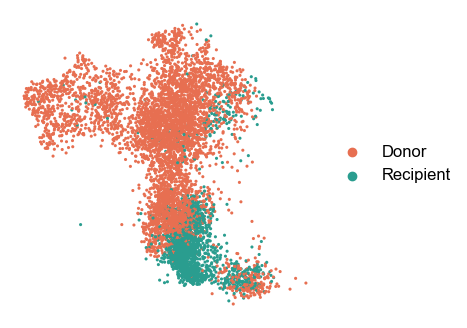

In [34]:

mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

tcell_ann_concat_Mobile_conv = tcell_ann_muxlet[tcell_ann_muxlet.obs['T_cell_subsets'].isin(['CD8+ tissue resident memory T cells','CD8+ effector T cells','CD8+ proliferating T cells'] ) & (tcell_ann_muxlet.obs['Migration_all'] == "Mobile")]
tcell_ann_concat_Mobile_conv_dr = tcell_ann_concat_Mobile_conv[~tcell_ann_concat_Mobile_conv.obs['sample_type'].isin(["Unclassified"])]

tcell_ann_concat_Mobile_conv_dr.uns['sample_type_colors'] = ['#e76f51', '#2a9d8f']
#sc.settings.figdir = '/burg/iicd
mpl.rcParams['figure.figsize'] = (4, 4)
# Now the plot will be saved in the specified directory
sc.pl.umap(tcell_ann_concat_Mobile_conv_dr[np.random.permutation(len(tcell_ann_concat_Mobile_conv_dr))],
    color=['sample_type'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=20,
    legend_loc= 'right margin',
    legend_fontsize = 12
)

plt.gca().set_title('')

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'sample_type_umap.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'sample_type_umap.svg', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'sample_type_umap.pdf', dpi=300, bbox_inches='tight')

In [35]:

# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in tcell_ann_concat.obs.columns]
tcell_ann_concat.obs = tcell_ann_concat.obs.drop(columns=existing)

# Transfer
tcell_ann_concat.obs = tcell_ann_concat.obs.join(
    tcell_ann_muxlet.obs[cols_to_transfer],
    how='left'
)
# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in tcell_ann_concat_Mobile.obs.columns]
tcell_ann_concat_Mobile.obs = tcell_ann_concat_Mobile.obs.drop(columns=existing)

# Transfer
tcell_ann_concat_Mobile.obs = tcell_ann_concat_Mobile.obs.join(
    tcell_ann_muxlet.obs[cols_to_transfer],
    how='left'
)       

# Drop cols if they already exist in the subset to avoid conflicts
existing = [c for c in cols_to_transfer if c in tcell_ann_concat_Mobile_conv.obs.columns]
tcell_ann_concat_Mobile_conv.obs = tcell_ann_concat_Mobile_conv.obs.drop(columns=existing)

# Transfer
tcell_ann_concat_Mobile_conv.obs = tcell_ann_concat_Mobile_conv.obs.join(
    tcell_ann_muxlet.obs[cols_to_transfer],
    how='left'
) 

In [36]:
# Cross-tab: rows = leiden, cols = sample/condition label
ct = pd.crosstab(Resi.obs['leiden'], Resi.obs['sample_type'])

# Percentage of each leiden cluster that is LPorIE
pct = ct.div(ct.sum(axis=1), axis=0) * 100

print(pct)

sample_type      Donor  Recipient  Unclassified
leiden                                         
0            36.910995  61.780105      1.308901
1             6.493506  93.290043      0.216450
2            51.801802  40.315315      7.882883
3            56.345178  40.101523      3.553299
4            95.593220   3.050847      1.355932
5            96.943231   2.183406      0.873362
6            93.750000   6.250000      0.000000


In [37]:
# concatenate the PatientID and GVHD_Grade_1 columns to create a new column for grouping
Resi.obs['SampleID_GVHD_Grade'] = Resi.obs['SampleID'].astype(str) + '_' + Resi.obs['GVHD_Grade_1'].astype(str)
Resi.obs['SampleID_GVHD_Grade'] = Resi.obs['SampleID_GVHD_Grade'].astype('category')

Resi.obs['PatientID_GVHD_Grade'] = Resi.obs['PatientID'].astype(str) + '_' + Resi.obs['GVHD_Grade_1'].astype(str)
Resi.obs['PatientID_GVHD_Grade'] = Resi.obs['PatientID_GVHD_Grade'].astype('category')

In [38]:
# annotate leiden clusters based on the above results and known marker genes
leiden_to_annotation = {
    '0': 'CD8+ Hobit- resident memory T cells',
    '1': 'CD8+ Hobit- resident memory T cells',
    '2': 'CD8+ Hobit+ PRDM1-lo resident memory T cells',
    '3': 'CD8+ Hobit+ PRDM1-lo resident memory T cells',
    '4': 'CD8+ Hobit+ PRDM1+ resident memory T cells',
    '5': 'CD8+ Hobit+ PRDM1+ resident memory T cells',
    '6': 'CD8+ Hobit- resident memory T cells',}

Resi.obs['leiden_annotation'] = Resi.obs['leiden'].map(leiden_to_annotation)

<Axes: title={'center': 'leiden_annotation'}, xlabel='UMAP1', ylabel='UMAP2'>

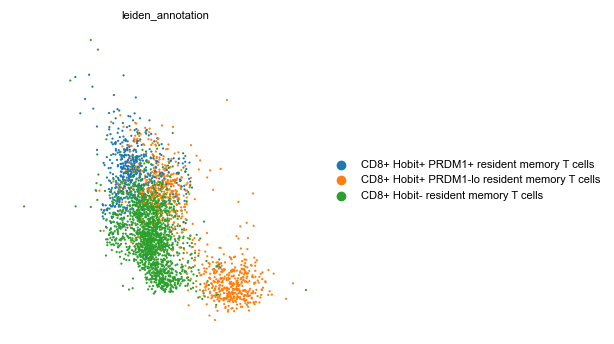

In [39]:
sc.pl.umap(Resi, color=['leiden_annotation'], show=False, frameon=False, title=None, s=10)

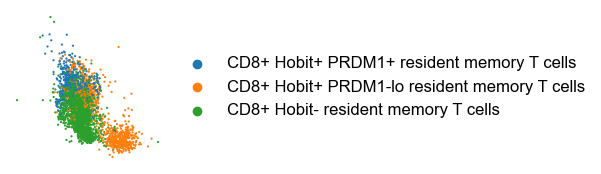

In [40]:

mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})

#sc.settings.figdir = '/burg/iicd
mpl.rcParams['figure.figsize'] = (2, 2)
# Now the plot will be saved in the specified directory
sc.pl.umap(Resi, color=['leiden_annotation'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=10,
    legend_loc= 'right margin',
    legend_fontsize = 12
)

plt.gca().set_title('')

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_annotated_umap.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_annotated_umap.svg', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'resi_leiden_annotated_umap.pdf', dpi=300, bbox_inches='tight')

In [41]:
# Cross-tab: rows = leiden, cols = sample/condition label
ct = pd.crosstab(Resi.obs['leiden_annotation'], Resi.obs['PatientID_GVHD_Grade'])

# Percentage of each leiden cluster that is LPorIE
pct = ct.div(ct.sum(axis=1), axis=0) * 100

print(pct)

PatientID_GVHD_Grade                          C068_Severe  C152_Severe  \
leiden_annotation                                                        
CD8+ Hobit+ PRDM1+ resident memory T cells      39.122137     1.526718   
CD8+ Hobit+ PRDM1-lo resident memory T cells     3.579952     5.011933   
CD8+ Hobit- resident memory T cells              0.403226     1.036866   

PatientID_GVHD_Grade                          C157_Mild  C159_Severe  \
leiden_annotation                                                      
CD8+ Hobit+ PRDM1+ resident memory T cells     7.633588     0.190840   
CD8+ Hobit+ PRDM1-lo resident memory T cells   1.312649     0.477327   
CD8+ Hobit- resident memory T cells            8.237327     0.057604   

PatientID_GVHD_Grade                            C160_No  C179_Mild  \
leiden_annotation                                                    
CD8+ Hobit+ PRDM1+ resident memory T cells    12.213740   0.000000   
CD8+ Hobit+ PRDM1-lo resident memory T cells   1.909308   

<Axes: title={'center': 'SampleID_GVHD_Grade'}, xlabel='UMAP1', ylabel='UMAP2'>

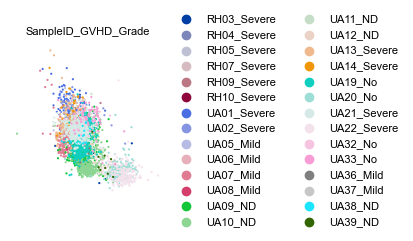

In [42]:
sc.pl.umap(Resi, color=['SampleID_GVHD_Grade'], show=False, frameon=False, title=None, s=10)  

<Axes: title={'center': 'leiden_annotation'}, xlabel='UMAP1', ylabel='UMAP2'>

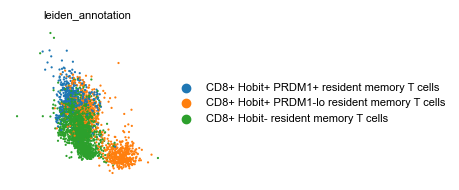

In [43]:
sc.pl.umap(Resi, color=[ 'leiden_annotation'], show=False, frameon=False, title=None, s=10)  

In [44]:
tcell_ann_concat_Mobile.obs['T_cell_subsets_refined_resi'] =tcell_ann_concat_Mobile.obs['T_cell_subsets']
tcell_ann_concat_Mobile.obs['T_cell_subsets_refined_resi'] = tcell_ann_concat_Mobile.obs['T_cell_subsets_refined_resi'].cat.add_categories(['CD8+ Hobit+ PRDM1+ resident memory T cells', 'CD8+ Hobit+ PRDM1-lo resident memory T cells', 'CD8+ Hobit- resident memory T cells'])
tcell_ann_concat_Mobile.obs.loc[tcell_ann_concat_Mobile.obs.index.isin(Resi[Resi.obs['leiden'].isin(['4','5'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1+ resident memory T cells'
tcell_ann_concat_Mobile.obs.loc[tcell_ann_concat_Mobile.obs.index.isin(Resi[Resi.obs['leiden'].isin(['2','3'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1-lo resident memory T cells'
tcell_ann_concat_Mobile.obs.loc[tcell_ann_concat_Mobile.obs.index.isin(Resi[Resi.obs['leiden'].isin(['0','1','6'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit- resident memory T cells'
tcell_ann_concat_Mobile_conv = tcell_ann_concat_Mobile[tcell_ann_concat_Mobile.obs['T_cell_subsets'].isin(['CD8+ tissue resident memory T cells','CD8+ effector T cells','CD8+ proliferating T cells'] )]
tcell_ann_concat_Mobile_conv.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile_conv.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Dates_from_Transplantation'].astype(str)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/3040036738.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_concat_Mobile_conv.obs['cc_aa_identity_Grade'] = tcell_ann_concat_Mobile_conv.obs['cc_aa_identity'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['PatientID'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Tissue_Location'].astype(str)+'_'+tcell_ann_concat_Mobile_conv.obs['Dates_from_Transplantation'].astype(str)


In [45]:
tcell_ann_concat.obs['T_cell_subsets_refined_resi'] =tcell_ann_concat.obs['T_cell_subsets']
tcell_ann_concat.obs['T_cell_subsets_refined_resi'] = tcell_ann_concat.obs['T_cell_subsets_refined_resi'].cat.add_categories(['CD8+ Hobit+ PRDM1+ resident memory T cells', 'CD8+ Hobit+ PRDM1-lo resident memory T cells', 'CD8+ Hobit- resident memory T cells'])
tcell_ann_concat.obs.loc[tcell_ann_concat.obs.index.isin(Resi[Resi.obs['leiden'].isin(['4','5'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1+ resident memory T cells'
tcell_ann_concat.obs.loc[tcell_ann_concat.obs.index.isin(Resi[Resi.obs['leiden'].isin(['2','3'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1-lo resident memory T cells'
tcell_ann_concat.obs.loc[tcell_ann_concat.obs.index.isin(Resi[Resi.obs['leiden'].isin(['0','1','6'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit- resident memory T cells'

In [46]:
tcell_ann_concat_Mobile_conv_dr.obs['T_cell_subsets_refined_resi'] =tcell_ann_concat_Mobile_conv_dr.obs['T_cell_subsets']
tcell_ann_concat_Mobile_conv_dr.obs['T_cell_subsets_refined_resi'] = tcell_ann_concat_Mobile_conv_dr.obs['T_cell_subsets_refined_resi'].cat.add_categories(['CD8+ Hobit+ PRDM1+ resident memory T cells', 'CD8+ Hobit+ PRDM1-lo resident memory T cells', 'CD8+ Hobit- resident memory T cells'])
tcell_ann_concat_Mobile_conv_dr.obs.loc[tcell_ann_concat_Mobile_conv_dr.obs.index.isin(Resi[Resi.obs['leiden'].isin(['4','5'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1+ resident memory T cells'
tcell_ann_concat_Mobile_conv_dr.obs.loc[tcell_ann_concat_Mobile_conv_dr.obs.index.isin(Resi[Resi.obs['leiden'].isin(['2','3'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit+ PRDM1-lo resident memory T cells'
tcell_ann_concat_Mobile_conv_dr.obs.loc[tcell_ann_concat_Mobile_conv_dr.obs.index.isin(Resi[Resi.obs['leiden'].isin(['0','1','6'])].obs.index),'T_cell_subsets_refined_resi'] = 'CD8+ Hobit- resident memory T cells'

In [47]:
celltype_colors = {
    'CD8+ Hobit+ PRDM1+ resident memory T cells': '#FFA500',
    'CD8+ Hobit+ PRDM1-lo resident memory T cells': '#17becf',
    'CD8+ Hobit- resident memory T cells': '#6a3d9a',
    'CD8+ effector T cells': '#1f77b4',
    'CD8+ proliferating T cells': '#e377c2',
}

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/301070222.py:36: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


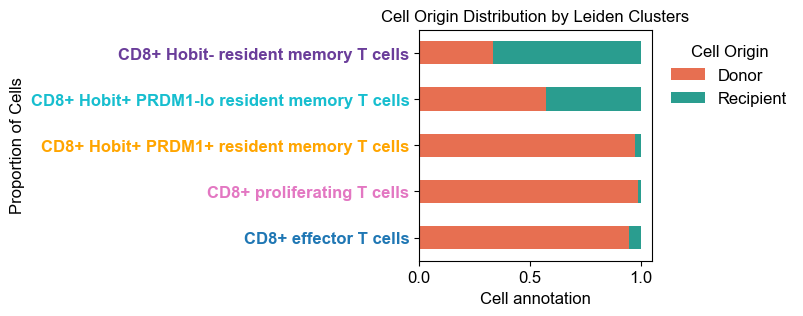

In [48]:
import matplotlib as mpl
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 12,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (3,3)  # Set default figure size to 6x4 inches
})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 12  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 12  # Colorbar tick label size

# plot bar plot of cell origin by leiden clusters
cluster_origin_counts = pd.crosstab(tcell_ann_concat_Mobile_conv_dr.obs['T_cell_subsets_refined_resi'], tcell_ann_concat_Mobile_conv_dr.obs['sample_type'])
cluster_origin_counts_norm = cluster_origin_counts.div(cluster_origin_counts.sum(axis=1), axis=0)

# Define color palette
color_palette = {'Donor': '#e76f51', 'Recipient': '#2a9d8f', 'Unclassified': 'dimgray'}

# Create color list in the order of columns
colors = [color_palette.get(col, 'gray') for col in cluster_origin_counts_norm.columns]

ax = cluster_origin_counts_norm.plot(kind='barh', stacked=True, color=colors)
plt.title("Cell Origin Distribution by Leiden Clusters")
plt.xlabel("Cell annotation")
plt.ylabel("Proportion of Cells")
plt.legend(title="Cell Origin", frameon=False, bbox_to_anchor=(1.02, 1))

# Color the y-axis labels with cluster colors and make them bold
for label in ax.get_yticklabels():
    cluster_name = label.get_text()
    if cluster_name in celltype_colors:
        label.set_color(celltype_colors[cluster_name])
    label.set_fontweight('bold')  # Make label bold

plt.tight_layout()
plt.savefig(FIGURES_SC_DIR / 'barplot_cell_origin_by_cluster_dr_mobile.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'barplot_cell_origin_by_cluster_dr_mobile.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_SC_DIR / 'barplot_cell_origin_by_cluster_dr_mobile.svg', dpi=300, bbox_inches='tight', transparent=True)
plt.show()

In [49]:
# Derive colors from celltype_colors dict — order-safe regardless of category changes
updated_colors = [celltype_colors.get(c, '#888888')
                  for c in tcell_ann_concat_Mobile_conv.obs['T_cell_subsets_refined_resi'].cat.categories]

In [50]:
# Set the color map for T_cell_subsets_refined_resi
tcell_ann_concat_Mobile_conv.uns['T_cell_subsets_refined_resi_colors'] = updated_colors

In [51]:
tcell_ann_concat_Mobile_conv.uns['T_cell_subsets_refined_resi_colors']

['#1f77b4', '#e377c2', '#FFA500', '#17becf', '#6a3d9a']

In [52]:
tcell_ann_concat_Mobile_conv.obs['T_cell_subsets_refined_resi'].unique().tolist()

['CD8+ effector T cells',
 'CD8+ Hobit+ PRDM1+ resident memory T cells',
 'CD8+ Hobit- resident memory T cells',
 'CD8+ proliferating T cells',
 'CD8+ Hobit+ PRDM1-lo resident memory T cells']

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


<Figure size 1000x600 with 0 Axes>

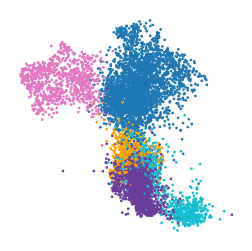

In [53]:

plt.figure(figsize=(10, 6))
# Now the plot will be saved in the specified directory
sc.pl.umap(tcell_ann_concat_Mobile_conv[np.random.permutation(len(tcell_ann_concat_Mobile_conv))],
    color=['T_cell_subsets_refined_resi'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=15,
    legend_loc= None,
    legend_fontsize = 10)

plt.gca().set_title('')

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap.svg', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap.pdf', dpi=300, bbox_inches='tight')

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/_core/anndata.py:1146: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


<Figure size 1000x600 with 0 Axes>

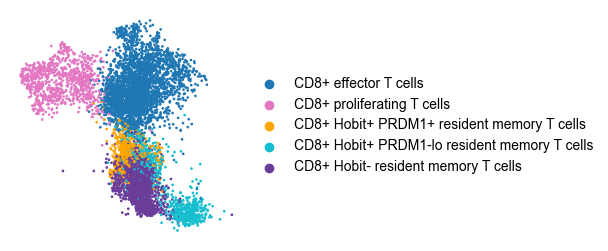

In [54]:
plt.figure(figsize=(10, 6))
sc.pl.umap(tcell_ann_concat_Mobile_conv[np.random.permutation(len(tcell_ann_concat_Mobile_conv))],
    color=['T_cell_subsets_refined_resi'],
    show=False,  # Do not show the plot yet,
    frameon=False,
    size=15,
    legend_loc= 'right margin',
    legend_fontsize = 10)

plt.gca().set_title('')

# Save the figure at 300 DPI
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap_legend.png', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap_legend.svg', dpi=300, bbox_inches='tight')
plt.savefig(FIGURES_TRAJ_DIR / 'leiden_Change_Resi_umap_legend.pdf', dpi=300, bbox_inches='tight')

<Axes: title={'center': 'leiden_annotation'}, xlabel='UMAP1', ylabel='UMAP2'>

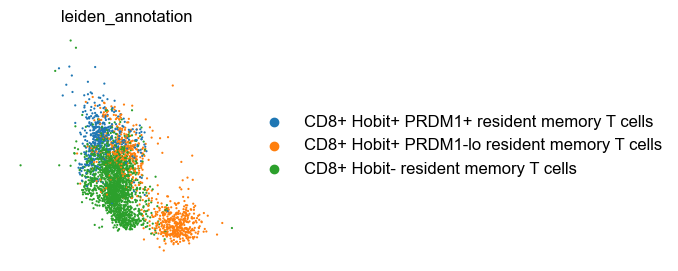

In [55]:
sc.pl.umap(Resi, color=['leiden_annotation'], show=False, frameon=False, title=None, s=10)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/1367660027.py:88: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


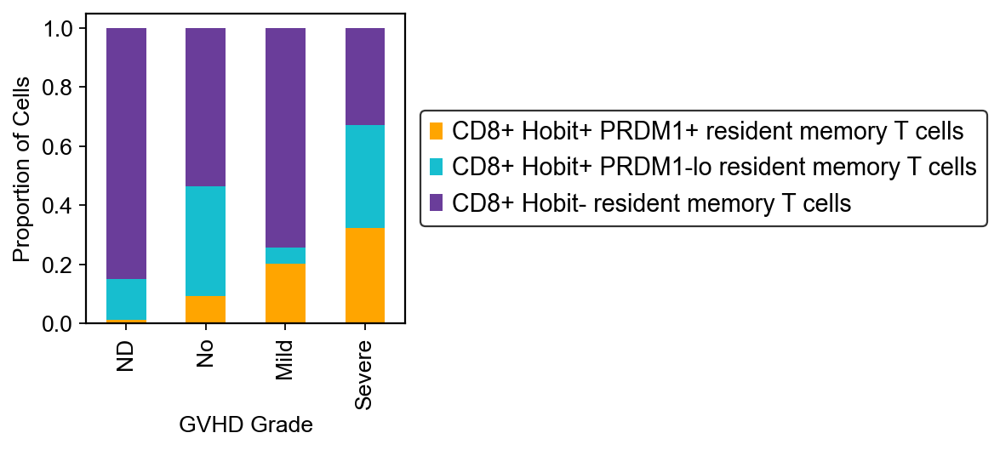

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/1367660027.py:100: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


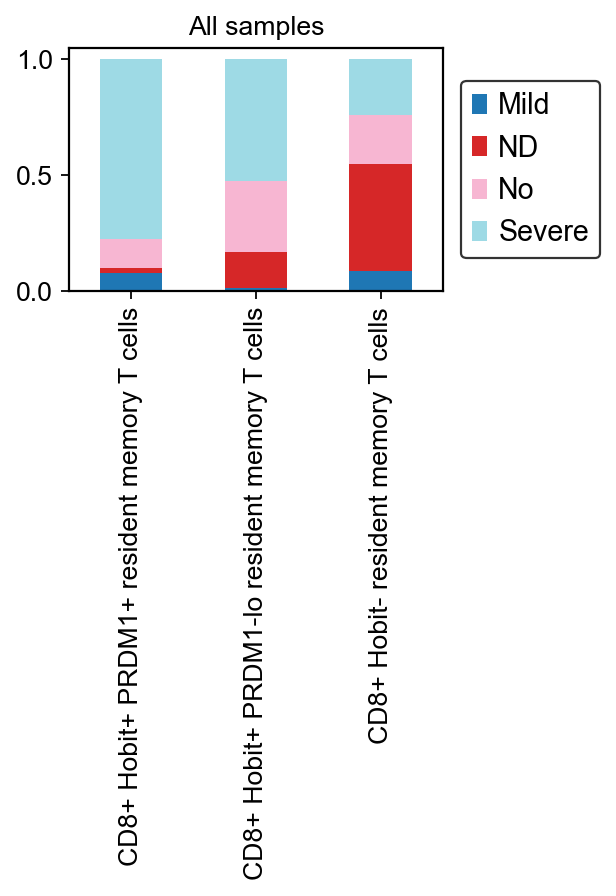

In [56]:
import seaborn as sns
from statannotations.Annotator import Annotator
from scipy import stats

# celltype_colors is defined earlier in this notebook — do not redefine here
sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1
mpl.rcParams['axes.grid'] = False
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 12,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['axes.labelsize'] = 12
mpl.rcParams['xtick.labelsize'] = 12
mpl.rcParams['ytick.labelsize'] = 12

obs_1 = 'GVHD_Grade_1'
obs_2 = 'leiden_annotation'

for adata in [Resi]:
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            if sums[col] > 0:
                obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            if sums2[col] > 0:
                obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    # Custom sorting: ND first, then no/treated, then mild, then severe
    sorter = []
    for grade in ['ND', 'No', 'Mild', 'Severe']:
        sorter.extend([col for col in obs1_clusters if grade in col])
    df_obs2 = df_obs2.reindex(columns=sorter)

    # Reorder rows so transitional is at the bottom of stacked bar
    row_order = ['CD8+ Hobit+ PRDM1+ resident memory T cells',
                 'CD8+ Hobit+ PRDM1-lo resident memory T cells',
                 'CD8+ Hobit- resident memory T cells']
    df_obs2 = df_obs2.reindex(row_order)

    # Use celltype_colors keyed by name — order-safe
    tcell_colors = [celltype_colors[c] for c in df_obs2.index]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors, figsize=(3, 3))
    plt.xlabel("GVHD Grade")
    plt.ylabel("Proportion of Cells")
    plt.title("")
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.tight_layout()
    plt.savefig(FIGURES_SC_DIR / 'fig_celltype_by_GVHD_Grade_stacked_barplot_all_300dpi.png', dpi=300, transparent=True, bbox_inches='tight')
    plt.savefig(FIGURES_SC_DIR / 'fig_celltype_by_GVHD_Grade_stacked_barplot_all_300dpi.pdf', dpi=300, transparent=True, bbox_inches='tight')
    plt.savefig(FIGURES_SC_DIR / 'fig_celltype_by_GVHD_Grade_stacked_barplot_all_300dpi.svg', dpi=300, transparent=True, bbox_inches='tight')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors, figsize=(3, 2))
    plt.title("All samples")
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.tight_layout()
    plt.savefig(FIGURES_SC_DIR / 'fig_GVHD_Grade_by_celltype_stacked_barplot_all_300dpi.png', dpi=300, transparent=True, bbox_inches='tight')
    plt.savefig(FIGURES_SC_DIR / 'fig_GVHD_Grade_by_celltype_stacked_barplot_all_300dpi.pdf', dpi=300, transparent=True, bbox_inches='tight')
    plt.savefig(FIGURES_SC_DIR / 'fig_GVHD_Grade_by_celltype_stacked_barplot_all_300dpi.svg', dpi=300, transparent=True, bbox_inches='tight')
    plt.show()


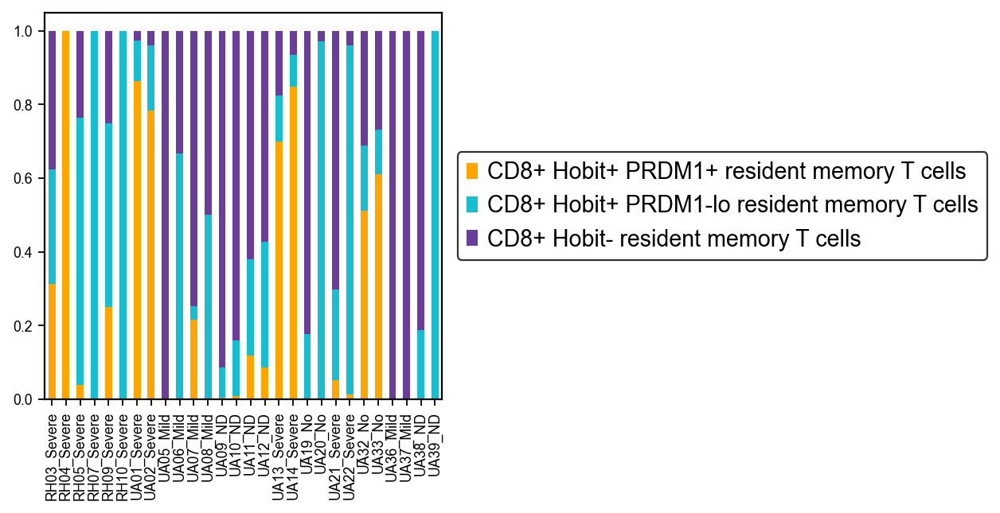

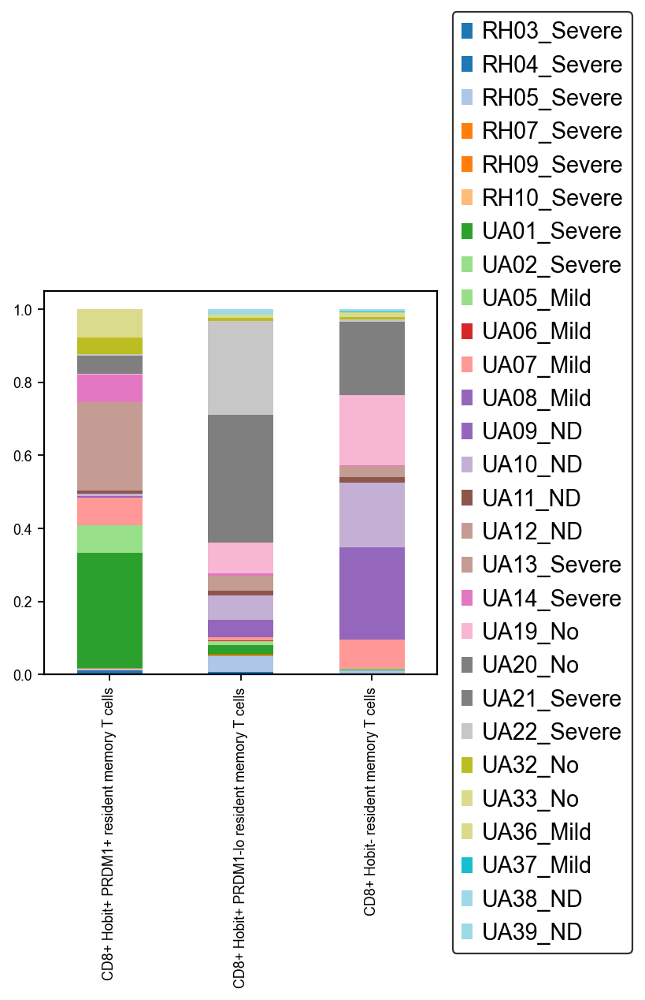

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/3242697355.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.577e-01
mild vs. severe: Custom statistical test, P_val:4.163e-02
no vs. severe: Custom statistical test, P_val:1.577e-01
Raw p-values: [0.10480410829012299, 0.07886513375170603, 0.0138763539750244]
Holm-corrected p-values: [0.15773027 0.15773027 0.04162906]
('no', 'mild'): corrected p = 0.157730 (not significant)
('no', 'severe'): corrected p = 0.157730 (not significant)
('mild', 'severe'): corrected p = 0.041629 (significant)
Number of samples per condition:
Grade
severe    12
no        10
mild       6
Name: count, dtype: int64


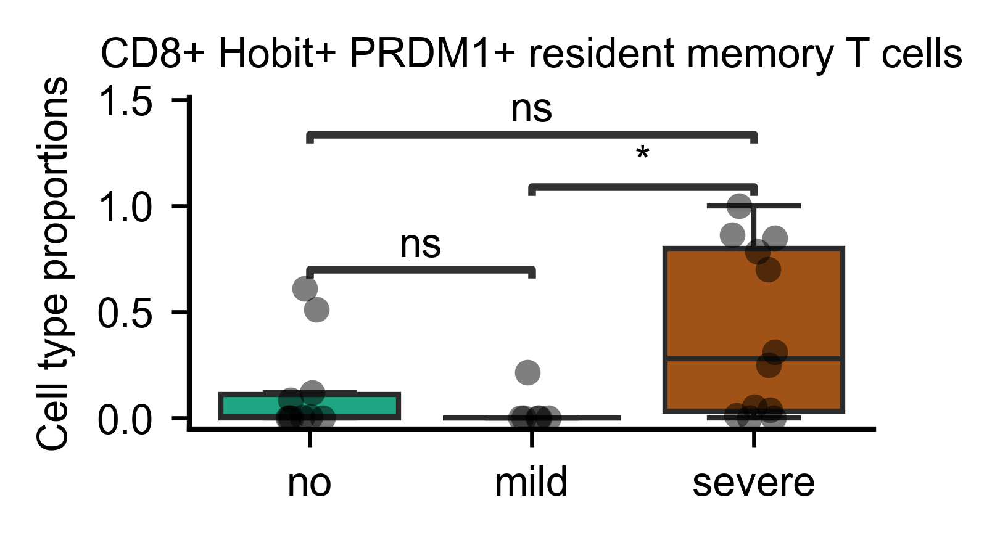

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/3242697355.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:1.419e-01
mild vs. severe: Custom statistical test, P_val:6.717e-03
no vs. severe: Custom statistical test, P_val:4.129e-02
Raw p-values: [0.14193958020766972, 0.02064716113032813, 0.0022390210300003636]
Holm-corrected p-values: [0.14193958 0.04129432 0.00671706]
('no', 'mild'): corrected p = 0.141940 (not significant)
('no', 'severe'): corrected p = 0.041294 (significant)
('mild', 'severe'): corrected p = 0.006717 (significant)
Number of samples per condition:
Grade
severe    12
no        10
mild       6
Name: count, dtype: int64


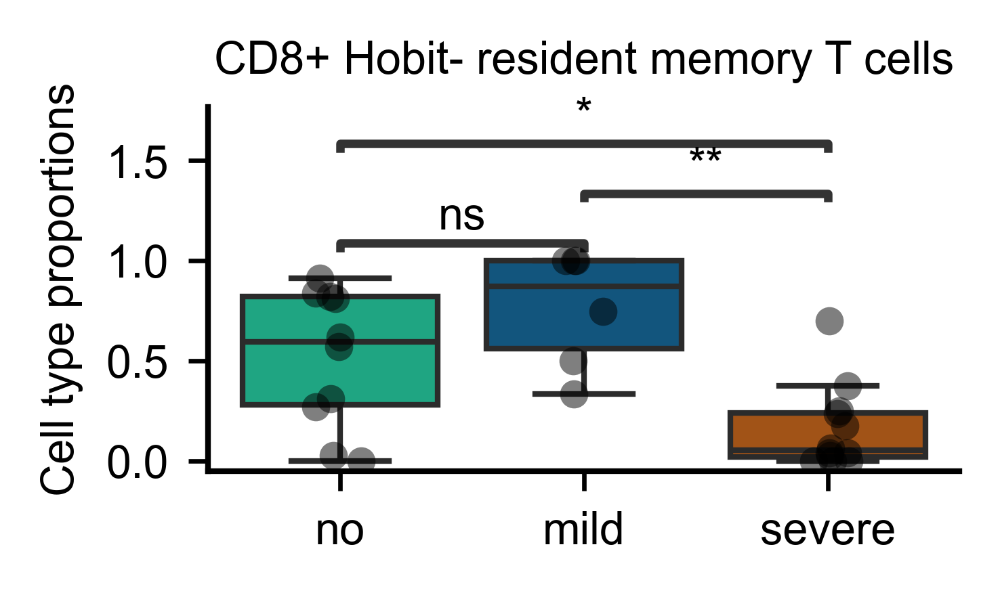

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/3242697355.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

no vs. mild: Custom statistical test, P_val:2.973e-01
mild vs. severe: Custom statistical test, P_val:2.973e-01
no vs. severe: Custom statistical test, P_val:8.173e-01
Raw p-values: [0.14193958020766972, 0.8172804387889328, 0.09909250126742165]
Holm-corrected p-values: [0.2972775  0.81728044 0.2972775 ]
('no', 'mild'): corrected p = 0.297278 (not significant)
('no', 'severe'): corrected p = 0.817280 (not significant)
('mild', 'severe'): corrected p = 0.297278 (not significant)
Number of samples per condition:
Grade
severe    12
no        10
mild       6
Name: count, dtype: int64


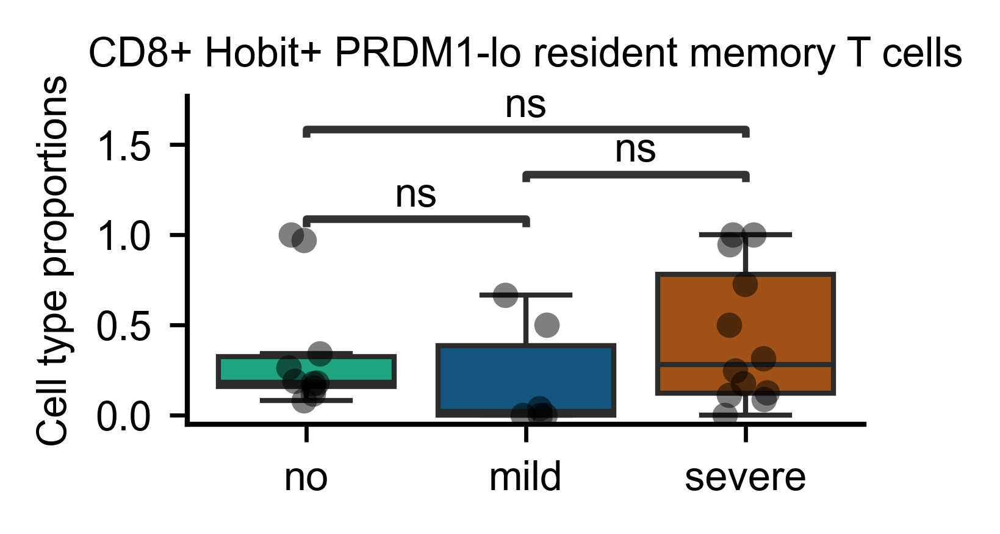

In [57]:
import seaborn as sns
from statannotations.Annotator import Annotator
from scipy import stats

sc.settings.set_figure_params(dpi_save=300)
mpl.rcParams['axes.linewidth'] = 1
mpl.rcParams['axes.grid'] = False
mpl.rcParams['text.color'] = 'black'
mpl.rcParams['axes.labelcolor'] = 'black'
mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['ytick.color'] = 'black'
mpl.rcParams['axes.titlecolor'] = 'black'
mpl.rcParams['legend.facecolor'] = 'white'
mpl.rcParams['legend.edgecolor'] = 'black'
mpl.rcParams['legend.labelcolor'] = 'black'
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['axes.labelsize'] = 8
mpl.rcParams['xtick.labelsize'] = 8
mpl.rcParams['ytick.labelsize'] = 8

obs_1 = 'SampleID_GVHD_Grade'
obs_2 = 'leiden_annotation'

for adata in [Resi]:
    n_categories = {x: len(adata.obs[x].cat.categories) for x in [obs_1, obs_2]}
    df = adata.obs[[obs_2, obs_1]].values

    obs2_clusters = adata.obs[obs_2].cat.categories.tolist()
    obs1_clusters = adata.obs[obs_1].cat.categories.tolist()

    obs1_to_obs2 = {k: np.zeros(len(obs2_clusters), dtype="i") for k in obs1_clusters}
    obs2_to_obs1 = {k: np.zeros(len(obs1_clusters), dtype="i") for k in obs2_clusters}
    for b, l in df:
        obs2_to_obs1[b][obs1_clusters.index(str(l))] += 1
        obs1_to_obs2[l][obs2_clusters.index(str(b))] += 1

    obs2_to_obs1_array = np.zeros((len(obs2_clusters), len(obs1_clusters)))
    obs1_to_obs2_array = np.zeros((len(obs1_clusters), len(obs2_clusters)))
    for idx, k in enumerate(obs2_clusters):
        obs2_to_obs1_array[idx, :] = deepcopy(obs2_to_obs1[k])
    for idx, k in enumerate(obs1_clusters):
        obs1_to_obs2_array[idx, :] = deepcopy(obs1_to_obs2[k])

    sums = np.sum(obs2_to_obs1_array, 0)
    for col in range(np.size(obs2_to_obs1_array, 1)):
        for row in range(np.size(obs2_to_obs1_array, 0)):
            obs2_to_obs1_array[row, col] = obs2_to_obs1_array[row, col] / sums[col]

    sums2 = np.sum(obs1_to_obs2_array, 0)
    for col in range(np.size(obs1_to_obs2_array, 1)):
        for row in range(np.size(obs1_to_obs2_array, 0)):
            obs1_to_obs2_array[row, col] = obs1_to_obs2_array[row, col] / sums2[col]

    df_obs2 = pd.DataFrame(obs2_to_obs1_array)
    df_obs2.index = obs2_clusters
    df_obs2.columns = obs1_clusters

    sorter = sorted(obs1_clusters)
    df_obs2 = df_obs2.reindex(columns=sorter)

    tcell_colors = [celltype_colors[c] for c in obs2_clusters]
    n_samples = len(obs1_clusters)
    cmap = mpl.colormaps['tab20'].resampled(n_samples)
    sample_colors = [mpl.colors.to_hex(cmap(i)) for i in range(n_samples)]

    df_obs2.T.plot(kind="bar", stacked=True, color=tcell_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    df_obs1 = pd.DataFrame(obs1_to_obs2_array)
    df_obs1.index = obs1_clusters
    df_obs1.columns = obs2_clusters
    df_obs1.T.plot(kind="bar", stacked=True, color=sample_colors)
    plt.legend(bbox_to_anchor=(1.01, 0.5), loc='center left')
    plt.show()

    for cell_type in adata.obs['leiden_annotation'].unique():
        substring = 'Severe'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_severe = df_obs2.loc[:, column_mask]
        severe = selected_columns_severe.loc[cell_type].values[
            ~np.isnan(selected_columns_severe.loc[cell_type].values)]

        substring = 'Mild'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_mild = df_obs2.loc[:, column_mask]
        mild = selected_columns_mild.loc[cell_type].values[
            ~np.isnan(selected_columns_mild.loc[cell_type].values)]

        substring = 'No'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_no = df_obs2.loc[:, column_mask]
        no = selected_columns_no.loc[cell_type].values[
            ~np.isnan(selected_columns_no.loc[cell_type].values)]

        substring = 'Treated'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_treated = df_obs2.loc[:, column_mask]
        treated = selected_columns_treated.loc[cell_type].values[
            ~np.isnan(selected_columns_treated.loc[cell_type].values)]

        substring = 'ND'
        column_mask = df_obs2.columns.str.contains(substring)
        selected_columns_nd = df_obs2.loc[:, column_mask]
        nd = selected_columns_nd.loc[cell_type].values[
            ~np.isnan(selected_columns_nd.loc[cell_type].values)]

        df_severe  = pd.DataFrame({'Value': severe,  'Grade': 'severe'})
        df_mild    = pd.DataFrame({'Value': mild,    'Grade': 'mild'})
        df_no      = pd.DataFrame({'Value': no,      'Grade': 'no'})
        df_treated = pd.DataFrame({'Value': treated, 'Grade': 'no'})
        df_ND      = pd.DataFrame({'Value': nd,      'Grade': 'no'})

        palette = {'no': '#09BB8C', 'mild': '#005A8F', 'severe': '#B85000'}

        result = pd.concat([df_no, df_treated, df_ND, df_mild, df_severe])
        fig, ax = plt.subplots(figsize=(2.5, 1.5), dpi=300)
        sns.boxplot(x='Grade', y='Value', data=result, ax=ax, palette=palette,
                    order=['no', 'mild', 'severe'], showfliers=False)
        sns.stripplot(x='Grade', y='Value', data=result, ax=ax, color='black',
                      alpha=0.5, jitter=True, order=['no', 'mild', 'severe'])

        ax.spines[['right', 'top']].set_visible(False)
        ax.set_xlabel('')
        ax.set_ylabel('Cell type proportions')
        ax.set_title(cell_type)
        ax.get_xaxis().tick_bottom()
        ax.get_yaxis().tick_left()

        pairs = [('no', 'mild'), ('no', 'severe'), ('mild', 'severe')]

        # Compute raw Mann-Whitney p-values
        pvals_raw = []
        for pair in pairs:
            group1 = result[result['Grade'] == pair[0]]['Value']
            group2 = result[result['Grade'] == pair[1]]['Value']
            _, pval = stats.mannwhitneyu(group1, group2, alternative='two-sided')
            pvals_raw.append(pval)

        # Apply Holm-Bonferroni correction
        corrected_pvals = multipletests(pvals_raw, method='holm')[1]

        # Annotate using corrected p-values
        annotator = Annotator(ax, pairs, data=result, x='Grade', y='Value',
                              order=['no', 'mild', 'severe'])
        annotator.set_pvalues_and_annotate(corrected_pvals)

        plt.tight_layout()

        print("Raw p-values:", pvals_raw)
        print("Holm-corrected p-values:", corrected_pvals)
        for idx, pair in enumerate(pairs):
            significance = "significant" if corrected_pvals[idx] < 0.05 else "not significant"
            print(f"{pair}: corrected p = {corrected_pvals[idx]:.6f} ({significance})")

        sample_counts = result['Grade'].value_counts()
        print("Number of samples per condition:")
        print(sample_counts)

        cell_type_safe = cell_type.replace(' ', '_').replace('+', 'pos').replace('/', '-')
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.png', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.pdf', dpi=300, transparent=True)
        plt.savefig(FIGURES_SC_DIR / f'fig_{cell_type_safe}_boxplot_300dpi.svg', dpi=300, transparent=True)
        plt.show()

In [58]:
sc.tl.rank_genes_groups(tcell_ann_concat_Mobile_conv, groupby='T_cell_subsets_refined_resi',use_raw=False, method='wilcoxon')
dedf = sc.get.rank_genes_groups_df(tcell_ann_concat_Mobile_conv, group=None)
dedf.to_csv(DEDF_SC_TCONVS_REFINED_OUTPUT_PATH)

In [59]:
# find the gene znf83 in the dedf
znf83_dedf = dedf[dedf['names'] == 'ZNF683']
print(znf83_dedf)

                                               group   names     scores  \
37793                          CD8+ effector T cells  ZNF683  -8.339788   
75253                     CD8+ proliferating T cells  ZNF683  -0.441665   
76051     CD8+ Hobit+ PRDM1+ resident memory T cells  ZNF683   9.340330   
114045  CD8+ Hobit+ PRDM1-lo resident memory T cells  ZNF683  20.040806   
189776           CD8+ Hobit- resident memory T cells  ZNF683 -10.996200   

        logfoldchanges         pvals     pvals_adj  
37793        -0.674563  7.442358e-17  5.337715e-15  
75253        -0.407572  6.587317e-01  1.000000e+00  
76051         1.226706  9.603383e-21  9.678617e-18  
114045        2.219150  2.428024e-89  9.229404e-86  
189776       -1.352324  3.985792e-28  4.117063e-26  


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/1770294491.py:35: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


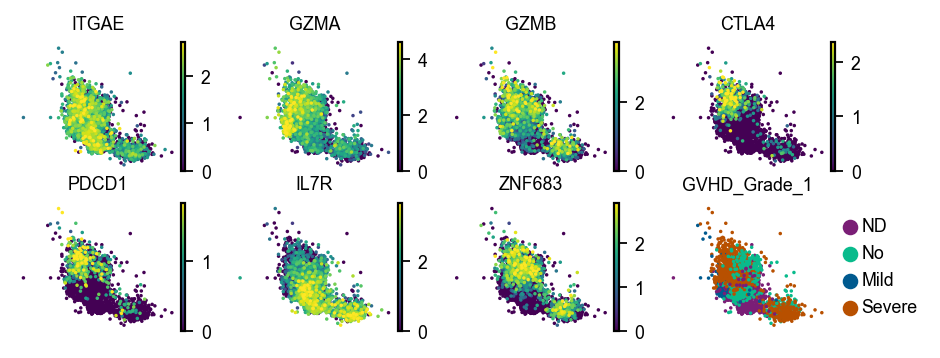

In [60]:
# Define the order you want
desired_order = ['ND','No', 'Mild', 'Severe']  # Adjust based on your data

# Convert to categorical with specified order
Resi.obs["GVHD_Grade_1"] = pd.Categorical(
    Resi.obs["GVHD_Grade_1"],
    categories=desired_order,
    ordered=True
)
Resi.uns["GVHD_Grade_1_colors"] = ['#7A1E76','#09BB8C','#005A8F', '#B85000']

mpl.rcParams['image.cmap'] = 'viridis'  # Or your preferred colormap
mpl.rcParams.update({'font.size': 8,
                    'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size
mpl.rcParams['axes.labelsize'] = 8


fig = sc.pl.umap(
    Resi,
    color=['ITGAE','GZMA','GZMB','CTLA4','PDCD1','IL7R','ZNF683',"GVHD_Grade_1"],
    show=False,  # Do not show the plot yet
    frameon=False,
    vmin=0,  # Set the minimum value for the IL7R color scale
    vmax=lambda x: np.quantile(x, 0.99),
    title=None,       # Remove title
    return_fig = True,
    s = 10,
    legend_fontsize=8 
)

fig.set_size_inches(6.5, 2.2)
plt.tight_layout()

# Save the figure at 300 DPI
fig.savefig(FIGURES_TRAJ_DIR / 'leiden_il7_grade_umap.png', dpi=300, transparent=True)
fig.savefig(FIGURES_TRAJ_DIR / 'leiden_il7_grade_umap.pdf', dpi=300, transparent=True)
fig.savefig(FIGURES_TRAJ_DIR / 'leiden_il7_grade_umap.svg', dpi=300, transparent=True)
plt.show()

[<Axes: title={'center': 'ITGAE'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GZMA'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GZMB'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'CTLA4'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'PDCD1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'IL7R'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'ZNF683'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'GVHD_Grade_1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'TOX'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'HAVCR2'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'LAG3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'CD28'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'PRDM1'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'RUNX3'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <Axes: title={'center': 'LPorIE'}, xlabel='UM

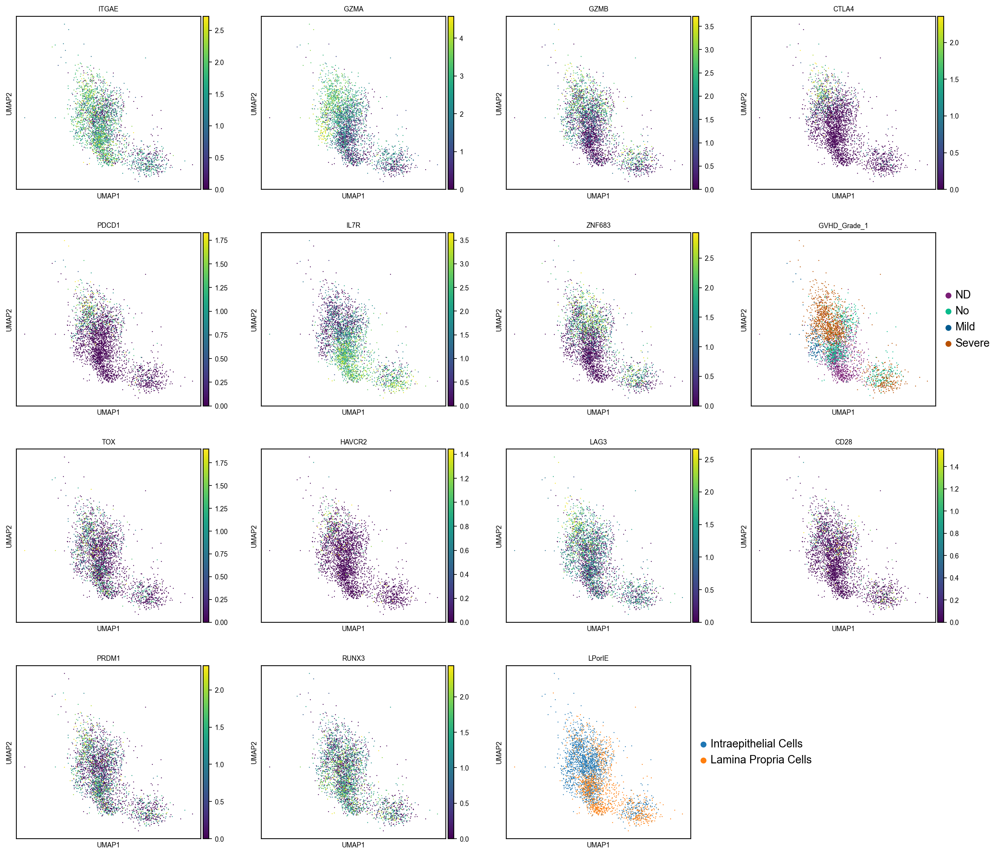

In [61]:
sc.pl.umap(Resi, color=['ITGAE','GZMA','GZMB','CTLA4','PDCD1','IL7R','ZNF683',"GVHD_Grade_1","TOX", "HAVCR2", "LAG3",'CD28','PRDM1','RUNX3', 'LPorIE'],vmin=0, vmax = lambda x: np.quantile(x, 0.99),s =5,show=False)    

grade: Mild
grade: ND
grade: No
grade: Severe


<Figure size 1200x480 with 0 Axes>

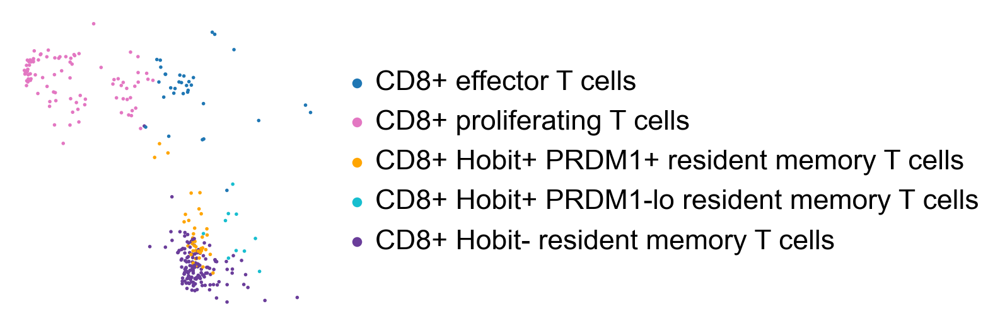

<Figure size 1200x480 with 0 Axes>

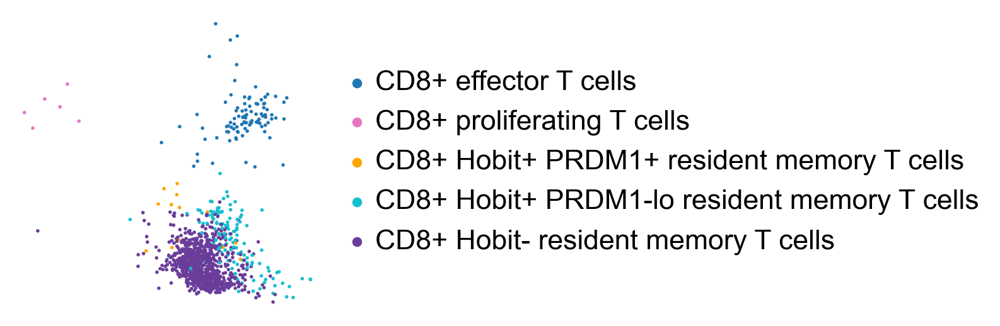

<Figure size 1200x480 with 0 Axes>

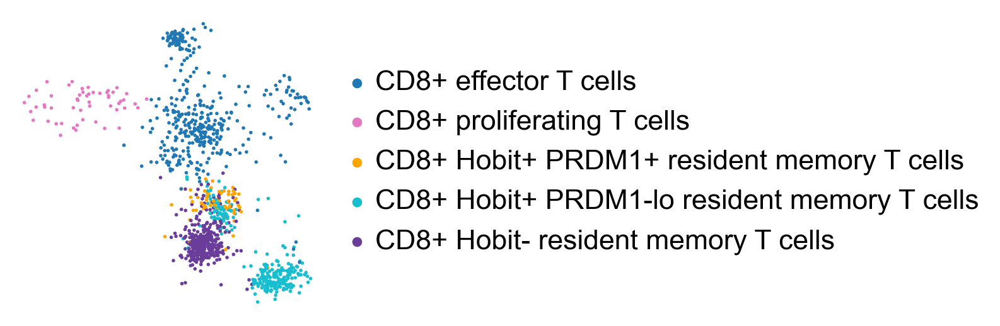

<Figure size 1200x480 with 0 Axes>

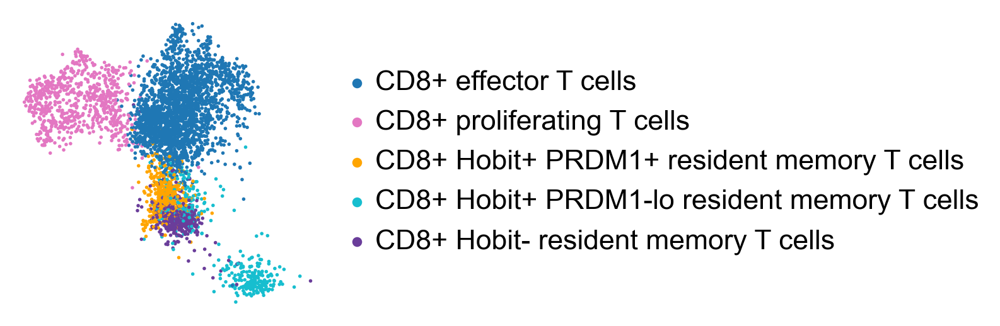

In [62]:
grade_col = "GVHD_Grade_1"
color_col = "T_cell_subsets_refined_resi"

# fix random order for overplotting (optional)
rng = np.random.default_rng(0)

for grade in tcell_ann_concat_Mobile_conv.obs[grade_col].cat.categories \
             if hasattr(tcell_ann_concat_Mobile_conv.obs[grade_col], "cat") \
             else tcell_ann_concat_Mobile_conv.obs[grade_col].dropna().unique():

    ad = tcell_ann_concat_Mobile_conv[tcell_ann_concat_Mobile_conv.obs[grade_col] == grade].copy()
    if ad.n_obs == 0:
        continue

    print('grade:', grade)

    # randomize draw order to avoid one group always on top
    ad = ad[rng.permutation(ad.n_obs)].copy()

    plt.figure(figsize=(15, 6))
    sc.pl.umap(
        ad,
        color=[color_col],
        show=False,
        frameon=False,
        size=25,
        legend_loc="right margin",
        legend_fontsize=20,
        title=""  # avoid default title
    )
    plt.gca().set_title("")

In [63]:
print(tcell_ann_concat_Mobile_conv.obs['T_cell_subsets_refined_resi'].unique().tolist())
print(tcell_ann_concat_Mobile_conv.uns.get('T_cell_subsets_refined_resi_colors', 'no colors found'))


['CD8+ effector T cells', 'CD8+ Hobit+ PRDM1+ resident memory T cells', 'CD8+ Hobit- resident memory T cells', 'CD8+ proliferating T cells', 'CD8+ Hobit+ PRDM1-lo resident memory T cells']
['#1f77b4', '#e377c2', '#FFA500', '#17becf', '#6a3d9a']


In [64]:
Resi.obs['leiden_annotation'].unique().tolist()

['CD8+ Hobit+ PRDM1+ resident memory T cells',
 'CD8+ Hobit- resident memory T cells',
 'CD8+ Hobit+ PRDM1-lo resident memory T cells']

In [65]:
# Cross-tab: rows = leiden, cols = sample/condition label
ct = pd.crosstab(tcell_ann_concat_Mobile_conv.obs["T_cell_subsets_refined_resi"], tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'])

# Percentage of each leiden cluster that is LPorIE
pct = ct.div(ct.sum(axis=1), axis=0) * 100

print(pct)

GVHD_Grade_1                                       Mild         ND         No  \
T_cell_subsets_refined_resi                                                     
CD8+ effector T cells                          1.140290   3.351762  13.718037   
CD8+ proliferating T cells                    10.232558   0.697674   6.279070   
CD8+ Hobit+ PRDM1+ resident memory T cells     7.633588   2.480916  12.404580   
CD8+ Hobit+ PRDM1-lo resident memory T cells   1.312649  15.513126  30.906921   
CD8+ Hobit- resident memory T cells            8.525346  46.198157  21.428571   

GVHD_Grade_1                                     Severe  
T_cell_subsets_refined_resi                              
CD8+ effector T cells                         81.789910  
CD8+ proliferating T cells                    82.790698  
CD8+ Hobit+ PRDM1+ resident memory T cells    77.480916  
CD8+ Hobit+ PRDM1-lo resident memory T cells  52.267303  
CD8+ Hobit- resident memory T cells           23.847926  


In [66]:
# -----------------------------
# Settings: define node order ONCE
# -----------------------------
STATE_COL       = "T_cell_subsets_refined_resi"
GRADE_COL       = "GVHD_Grade_1"
LOC_COL         = "LPorIE"
CLONE_COL       = "cc_aa_identity_Grade"
SAMPLE_TYPE_COL = "sample_type"
LP_LABEL        = "Lamina Propria Cells"
IE_LABEL        = "Intraepithelial Cells"
RECIPIENT_LABEL = "Recipient"
DONOR_LABEL     = "Donor"

CELL_TYPES = [
    'CD8+ effector T cells',
    'CD8+ Hobit+ PRDM1+ resident memory T cells',
    'CD8+ Hobit- resident memory T cells',
    'CD8+ proliferating T cells',
    'CD8+ Hobit+ PRDM1-lo resident memory T cells',
]

# Node colors match CELL_TYPES order
NODE_COLORS = ['#1f77b4', '#FFA500', '#6a3d9a', '#e377c2', '#17becf']

# Base RGB for each source state (must match NODE_COLORS order)
_link_base_colors = [
    (31,  119, 180),   # effector: blue
    (255, 165,   0),   # hobit+ transitional: orange
    (106,  61, 154),   # hobit- Trm: purple
    (227, 119, 194),   # proliferating: pink
    (23,  190, 207),   # hobit+ PRDM1 low Trm: cyan
]

n = len(CELL_TYPES)

def _make_link_colors(alpha):
    return [f'rgba({r}, {g}, {b}, {alpha})' for r, g, b in _link_base_colors for _ in range(n)]

link_colors_donor     = _make_link_colors(0.75)
link_colors_recipient = _make_link_colors(0.25)

sources = [s for s in range(n) for _ in range(n)]
targets = [n + t for _ in range(n) for t in range(n)]


def dominant_state_per_clone(lp_obs, clone_col=CLONE_COL, state_col=STATE_COL, ordered_states=CELL_TYPES):
    """
    Assign each clone to one dominant LP state using majority vote.
    Ties are broken by CELL_TYPES order.
    """
    priority = {state: i for i, state in enumerate(ordered_states)}

    def pick_state(x):
        counts = x.value_counts()
        max_count = counts.max()
        tied_states = counts[counts == max_count].index.tolist()
        tied_states = sorted(tied_states, key=lambda s: priority.get(s, 999))
        return tied_states[0]

    clone_to_state = (
        lp_obs.groupby(clone_col, observed=True)[state_col]
        .apply(pick_state)
    )
    return clone_to_state


# -----------------------------
# Main loop
# -----------------------------
for gvhd_grade in tcell_ann_concat_Mobile_conv.obs[GRADE_COL].unique():
    print("\n==============================")
    print("GVHD grade:", gvhd_grade)

    tcr_dataset = tcell_ann_concat_Mobile_conv[
        tcell_ann_concat_Mobile_conv.obs[GRADE_COL] == gvhd_grade
    ].copy()

    tcr_dataset.obs[STATE_COL] = pd.Categorical(
        tcr_dataset.obs[STATE_COL],
        categories=CELL_TYPES,
        ordered=True,
    )

    obs_df = tcr_dataset.obs.copy()

    # Split LP and IE first
    lp_all = tcr_dataset[tcr_dataset.obs[LOC_COL] == LP_LABEL].copy()
    ie_all = tcr_dataset[tcr_dataset.obs[LOC_COL] == IE_LABEL].copy()

    # Keep only shared/mobile clones within this grade
    shared_clones = np.intersect1d(
        lp_all.obs[CLONE_COL].unique(),
        ie_all.obs[CLONE_COL].unique()
    )

    lp_all = lp_all[lp_all.obs[CLONE_COL].isin(shared_clones)].copy()
    ie_all = ie_all[ie_all.obs[CLONE_COL].isin(shared_clones)].copy()

    print(f"Shared/mobile clones: {len(shared_clones)}")
    print(f"LP mobile cells: {lp_all.n_obs}")
    print(f"IE mobile cells: {ie_all.n_obs}")

    # Assign each clone to ONE dominant LP state
    clone_to_lp_state = dominant_state_per_clone(
        lp_all.obs,
        clone_col=CLONE_COL,
        state_col=STATE_COL,
        ordered_states=CELL_TYPES
    )

    # Add dominant LP state annotation to LP and IE cells by clone
    lp_all.obs["dominant_lp_state"] = lp_all.obs[CLONE_COL].map(clone_to_lp_state)
    ie_all.obs["dominant_lp_state"] = ie_all.obs[CLONE_COL].map(clone_to_lp_state)

    lp_all.obs["dominant_lp_state"] = pd.Categorical(
        lp_all.obs["dominant_lp_state"],
        categories=CELL_TYPES,
        ordered=True,
    )
    ie_all.obs["dominant_lp_state"] = pd.Categorical(
        ie_all.obs["dominant_lp_state"],
        categories=CELL_TYPES,
        ordered=True,
    )

    # Left-side weights = proportion of LP mobile cells assigned to each dominant LP state
    lp_weights = (
        lp_all.obs["dominant_lp_state"]
        .value_counts(normalize=True, sort=False)
        .reindex(CELL_TYPES)
        .fillna(0.0)
    )

    print("\nLP weights (mobile LP cells, after one-state-per-clone assignment):")
    print(lp_weights)

    # Flow matrices: rows = IE target state, cols = LP source state
    df_mat_donor     = pd.DataFrame(0.0, index=CELL_TYPES, columns=CELL_TYPES)
    df_mat_recipient = pd.DataFrame(0.0, index=CELL_TYPES, columns=CELL_TYPES)

    # Build Sankey from unique clone assignment
    for state in CELL_TYPES:
        lp_weight = lp_weights.loc[state]
        if lp_weight == 0:
            continue

        # IE cells from clones whose dominant LP state is this source state
        ie_from_state = ie_all[ie_all.obs["dominant_lp_state"] == state].copy()
        if ie_from_state.n_obs == 0:
            continue

        n_ie_from_state = ie_from_state.n_obs

        donor_ie = ie_from_state[ie_from_state.obs[SAMPLE_TYPE_COL] == DONOR_LABEL]
        recipient_ie = ie_from_state[ie_from_state.obs[SAMPLE_TYPE_COL] == RECIPIENT_LABEL]

        donor_frac = donor_ie.n_obs / n_ie_from_state
        recipient_frac = recipient_ie.n_obs / n_ie_from_state

        lp_weight_donor = lp_weight * donor_frac
        lp_weight_recipient = lp_weight * recipient_frac

        if donor_ie.n_obs > 0:
            vc_donor = (
                donor_ie.obs[STATE_COL]
                .value_counts(normalize=True, sort=False)
                .reindex(CELL_TYPES)
                .fillna(0.0)
            )
            df_mat_donor.loc[:, state] = vc_donor.values * lp_weight_donor

        if recipient_ie.n_obs > 0:
            vc_recipient = (
                recipient_ie.obs[STATE_COL]
                .value_counts(normalize=True, sort=False)
                .reindex(CELL_TYPES)
                .fillna(0.0)
            )
            df_mat_recipient.loc[:, state] = vc_recipient.values * lp_weight_recipient

    print("\nDonor 5x5 flow matrix (rows=target/right, cols=source/left):")
    print(df_mat_donor)

    print("\nRecipient 5x5 flow matrix (rows=target/right, cols=source/left):")
    print(df_mat_recipient)

    # Sanity checks
    sankey_right = df_mat_donor.sum(axis=1) + df_mat_recipient.sum(axis=1)
    ie_true_dist = (
        ie_all.obs[STATE_COL]
        .value_counts(normalize=True, sort=False)
        .reindex(CELL_TYPES)
        .fillna(0.0)
    )

    sanity_df = pd.DataFrame({
        "IE_true_mobile": ie_true_dist,
        "IE_from_sankey": sankey_right
    })
    sanity_df["diff"] = sanity_df["IE_from_sankey"] - sanity_df["IE_true_mobile"]

    print("\nSanity check: IE marginal distribution")
    print(sanity_df)
    print("\nTotal Sankey mass:", sankey_right.sum())

    values_donor     = [float(df_mat_donor.loc[tgt, src])     for src in CELL_TYPES for tgt in CELL_TYPES]
    values_recipient = [float(df_mat_recipient.loc[tgt, src]) for src in CELL_TYPES for tgt in CELL_TYPES]

    if np.allclose(values_donor, 0) and np.allclose(values_recipient, 0):
        print("All Sankey values are 0 for this GVHD grade; skipping plot.")
        continue

    fig = go.Figure(data=[go.Sankey(
        arrangement="snap",
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=[],
            color=NODE_COLORS * 2,
        ),
        link=dict(
            source=sources + sources,
            target=targets + targets,
            value=values_donor + values_recipient,
            color=link_colors_donor + link_colors_recipient,
        ),
    )])

    fig.update_layout(
        title_text=f"",
        font=dict(family="Arial", size=18, color="black")
    )

    fig.show()

    fig.write_image(FIGURES_TRAJ_DIR / f'{gvhd_grade}_sankey_diagram_dominantLP.png', scale=4)
    fig.write_image(FIGURES_TRAJ_DIR / f'{gvhd_grade}_sankey_diagram_dominantLP.svg', scale=4)
    fig.write_image(FIGURES_TRAJ_DIR / f'{gvhd_grade}_sankey_diagram_dominantLP.pdf', scale=4)


GVHD grade: Severe
Shared/mobile clones: 405
LP mobile cells: 1957
IE mobile cells: 2124

LP weights (mobile LP cells, after one-state-per-clone assignment):
dominant_lp_state
CD8+ effector T cells                           0.750128
CD8+ Hobit+ PRDM1+ resident memory T cells      0.045478
CD8+ Hobit- resident memory T cells             0.000000
CD8+ proliferating T cells                      0.086868
CD8+ Hobit+ PRDM1-lo resident memory T cells    0.117527
Name: proportion, dtype: float64

Donor 5x5 flow matrix (rows=target/right, cols=source/left):
                                              CD8+ effector T cells  \
CD8+ effector T cells                                      0.512987   
CD8+ Hobit+ PRDM1+ resident memory T cells                 0.069422   
CD8+ Hobit- resident memory T cells                        0.018431   
CD8+ proliferating T cells                                 0.101369   
CD8+ Hobit+ PRDM1-lo resident memory T cells               0.032561   

                


GVHD grade: No
Shared/mobile clones: 123
LP mobile cells: 689
IE mobile cells: 409

LP weights (mobile LP cells, after one-state-per-clone assignment):
dominant_lp_state
CD8+ effector T cells                           0.330914
CD8+ Hobit+ PRDM1+ resident memory T cells      0.060958
CD8+ Hobit- resident memory T cells             0.487663
CD8+ proliferating T cells                      0.007257
CD8+ Hobit+ PRDM1-lo resident memory T cells    0.113208
Name: proportion, dtype: float64

Donor 5x5 flow matrix (rows=target/right, cols=source/left):
                                              CD8+ effector T cells  \
CD8+ effector T cells                                      0.232344   
CD8+ Hobit+ PRDM1+ resident memory T cells                 0.007041   
CD8+ Hobit- resident memory T cells                        0.007041   
CD8+ proliferating T cells                                 0.024643   
CD8+ Hobit+ PRDM1-lo resident memory T cells               0.005281   

                      


GVHD grade: Mild
Shared/mobile clones: 21
LP mobile cells: 38
IE mobile cells: 268

LP weights (mobile LP cells, after one-state-per-clone assignment):
dominant_lp_state
CD8+ effector T cells                           0.447368
CD8+ Hobit+ PRDM1+ resident memory T cells      0.000000
CD8+ Hobit- resident memory T cells             0.105263
CD8+ proliferating T cells                      0.342105
CD8+ Hobit+ PRDM1-lo resident memory T cells    0.105263
Name: proportion, dtype: float64

Donor 5x5 flow matrix (rows=target/right, cols=source/left):
                                              CD8+ effector T cells  \
CD8+ effector T cells                                      0.286316   
CD8+ Hobit+ PRDM1+ resident memory T cells                 0.000000   
CD8+ Hobit- resident memory T cells                        0.035789   
CD8+ proliferating T cells                                 0.107368   
CD8+ Hobit+ PRDM1-lo resident memory T cells               0.017895   

                      


GVHD grade: ND
Shared/mobile clones: 102
LP mobile cells: 438
IE mobile cells: 588

LP weights (mobile LP cells, after one-state-per-clone assignment):
dominant_lp_state
CD8+ effector T cells                           0.091324
CD8+ Hobit+ PRDM1+ resident memory T cells      0.009132
CD8+ Hobit- resident memory T cells             0.767123
CD8+ proliferating T cells                      0.002283
CD8+ Hobit+ PRDM1-lo resident memory T cells    0.130137
Name: proportion, dtype: float64

Donor 5x5 flow matrix (rows=target/right, cols=source/left):
                                              CD8+ effector T cells  \
CD8+ effector T cells                                           0.0   
CD8+ Hobit+ PRDM1+ resident memory T cells                      0.0   
CD8+ Hobit- resident memory T cells                             0.0   
CD8+ proliferating T cells                                      0.0   
CD8+ Hobit+ PRDM1-lo resident memory T cells                    0.0   

                      

In [67]:
target_cell_type = 'CD8+ Hobit+ PRDM1+ resident memory T cells'  # adjust to exact label in your data

grades = tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'].unique()

print("=" * 70)
print(f"Fisher's Exact Test: LP vs IE for '{target_cell_type}' by Grade")
print("=" * 70)

# First pass: collect all p-values across grades
results = []

for grade in grades:
    tcr_dataset = tcell_ann_concat_Mobile_conv[tcell_ann_concat_Mobile_conv.obs['GVHD_Grade_1'] == grade]
    obs_df = tcr_dataset.obs

    pivot_table = pd.pivot_table(obs_df, values='cc_aa_identity_Grade',
                                  index='T_cell_subsets_refined_resi',
                                  columns='LPorIE', aggfunc='count')

    if target_cell_type not in pivot_table.index:
        print(f"\nGrade {grade}: '{target_cell_type}' not found — skipping.")
        continue

    col_totals = pivot_table.sum(axis=0)
    count_lp = pivot_table.loc[target_cell_type, 'Lamina Propria Cells']
    count_ie = pivot_table.loc[target_cell_type, 'Intraepithelial Cells']
    other_lp = col_totals['Lamina Propria Cells'] - count_lp
    other_ie = col_totals['Intraepithelial Cells'] - count_ie

    contingency_table = np.array([[count_lp, count_ie],
                                   [other_lp,  other_ie]])

    odds_ratio, p_val = fisher_exact(contingency_table, alternative='two-sided')

    prop_lp = count_lp / col_totals['Lamina Propria Cells']
    prop_ie = count_ie / col_totals['Intraepithelial Cells']

    results.append({
        'grade':        grade,
        'count_lp':     count_lp,
        'count_ie':     count_ie,
        'total_lp':     col_totals['Lamina Propria Cells'],
        'total_ie':     col_totals['Intraepithelial Cells'],
        'prop_lp':      prop_lp,
        'prop_ie':      prop_ie,
        'odds_ratio':   odds_ratio,
        'p_val':        p_val,
    })

# Second pass: apply Benjamini-Hochberg FDR correction across grades
if results:
    p_vals = [r['p_val'] for r in results]
    reject, p_adj, _, _ = multipletests(p_vals, method='fdr_bh')

    print(f"\n{'─'*70}")
    print(f"Results with Benjamini-Hochberg FDR correction (across {len(results)} grades)")
    print('─'*70)

    for r, p_corrected, rej in zip(results, p_adj, reject):
        print(f"\nGrade: {r['grade']}")
        print(f"  LP: {r['count_lp']}/{int(r['total_lp'])} = {r['prop_lp']:.4f} ({r['prop_lp']*100:.2f}%)")
        print(f"  IE: {r['count_ie']}/{int(r['total_ie'])} = {r['prop_ie']:.4f} ({r['prop_ie']*100:.2f}%)")
        print(f"  Odds Ratio:   {r['odds_ratio']:.4f}")
        print(f"  P-value (raw):  {r['p_val']:.4e}")
        print(f"  P-value (FDR):  {p_corrected:.4e}")

        if p_corrected < 0.001:
            sig = "*** (FDR < 0.001)"
        elif p_corrected < 0.01:
            sig = "** (FDR < 0.01)"
        elif p_corrected < 0.05:
            sig = "* (FDR < 0.05)"
        else:
            sig = "ns (FDR >= 0.05)"
        print(f"  Significance: {sig}")

Fisher's Exact Test: LP vs IE for 'CD8+ Hobit+ PRDM1+ resident memory T cells' by Grade

──────────────────────────────────────────────────────────────────────
Results with Benjamini-Hochberg FDR correction (across 4 grades)
──────────────────────────────────────────────────────────────────────

Grade: Severe
  LP: 88/2096 = 0.0420 (4.20%)
  IE: 318/2241 = 0.1419 (14.19%)
  Odds Ratio:   0.2650
  P-value (raw):  4.6641e-31
  P-value (FDR):  1.8657e-30
  Significance: *** (FDR < 0.001)

Grade: No
  LP: 42/713 = 0.0589 (5.89%)
  IE: 23/434 = 0.0530 (5.30%)
  Odds Ratio:   1.1185
  P-value (raw):  7.9247e-01
  P-value (FDR):  1.0000e+00
  Significance: ns (FDR >= 0.05)

Grade: Mild
  LP: 0/40 = 0.0000 (0.00%)
  IE: 40/280 = 0.1429 (14.29%)
  Odds Ratio:   0.0000
  P-value (raw):  4.5290e-03
  P-value (FDR):  9.0580e-03
  Significance: ** (FDR < 0.01)

Grade: ND
  LP: 6/452 = 0.0133 (1.33%)
  IE: 7/596 = 0.0117 (1.17%)
  Odds Ratio:   1.1320
  P-value (raw):  1.0000e+00
  P-value (FDR):  1

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/776117864.py:16: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/776117864.py:16: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/776117864.py:16: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/776117864.py:16: FutureWarning:

The default value of obser

In [68]:
bins = [-np.inf, 1, 2, np.inf]
labels = ['<=1', '<=2', '>2']
clone_sizes = tcell_ann_concat.obs['clone_id_size'].astype(float)
tcell_ann_concat.obs['clonal_expansion'] = pd.Categorical(
pd.cut(clone_sizes, bins=bins, labels=labels, include_lowest=True),
categories=labels,
ordered=True
)

In [69]:
tcell_ann_concat.obs['clonal_expansion'].unique()

['<=1', NaN, '<=2', '>2']
Categories (3, object): ['<=1' < '<=2' < '>2']

In [70]:

# Optionally set plotting colors
colors_bin = ['#1f77b4', '#ff7f0e', '#2ca02c', 'gray']
tcell_ann_concat.uns['clonal_expansion_colors'] = colors_bin

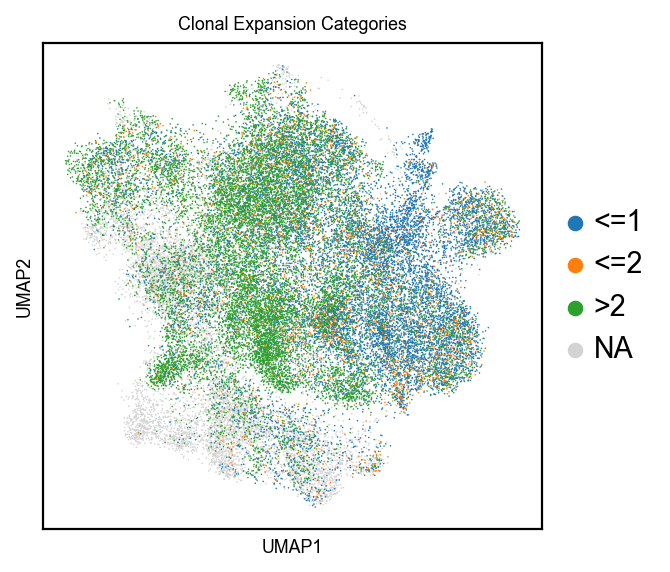

In [71]:
sc.pl.umap(tcell_ann_concat, color='clonal_expansion', title='Clonal Expansion Categories', s= 2)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53513/4103445976.py:40: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



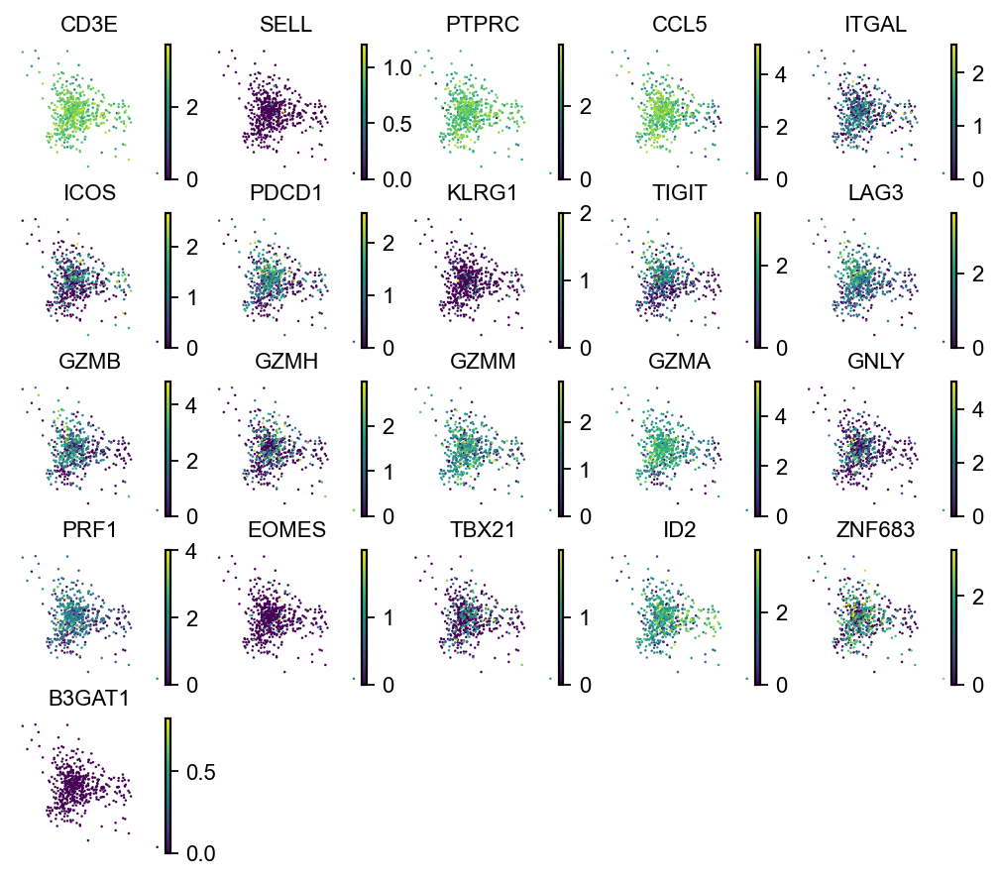

In [72]:
# plot these gene for CD8+ hobit+ resident memory T cells
genes_of_interest = [
    "CD3E",
    "SELL",
    "PTPRC",
    "CCL5",
    "ITGAL",
    "ICOS",
    "PDCD1",
    "KLRG1",
    "TIGIT",
    "LAG3",
    "GZMB",
    "GZMH",
    "GZMM",
    "GZMA",
    "GNLY",
    "PRF1",
    "EOMES",
    "TBX21",
    "ID2",
    "ZNF683",
    "B3GAT1",
]

mpl.rcParams['image.cmap'] = 'viridis'
mpl.rcParams.update({'font.size': 10})
mpl.rcParams['axes.titlesize'] = 10
mpl.rcParams['xtick.labelsize'] = 10
mpl.rcParams['ytick.labelsize'] = 10

adata_subset = tcell_ann_concat[tcell_ann_concat.obs['T_cell_subsets_refined_resi'] == target_cell_type]
fig = sc.pl.umap(adata_subset, color=genes_of_interest, ncols=5,
           show=False,
           frameon=False,
           return_fig=True,
           size=5)

fig.set_size_inches(7.5, 6)
plt.tight_layout()
fig.savefig(FIGURES_SC_DIR / "gut_cam_genes.png", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "gut_cam_genes.pdf", dpi=300, bbox_inches='tight')
fig.savefig(FIGURES_SC_DIR / "gut_cam_genes.svg", dpi=300, bbox_inches='tight')
plt.show()

In [73]:
tcell_ann_concat.write(TCELL_ANN_CONCAT_REFINED_PATH)

In [74]:
Resi.write(RESI_PATH)